# ML(H)
## John Williamson 2019/2020

---

# Visualisation in machine learning

## Outline
In this lab we will explore how we can use visualisation to explore data before we begin training models. We will do this in the context of a challenge to classify audio data.

### Task
The task involves optimising the pre-processing of features for a simple classification problem, using visualisation (unsupervised learning) to help guide you in choosing good feature vector selection. The idea is to get *insight* into the data **using visualisation** to create effective machine learning models.

### Classifier
We will only use the most basic of classifiers in this example -- **k nearest neighbours** -- and focus on how to process the features to make this simple algorithm work as effectively as possible. Many modern approaches would use deep learning to learn an end-to-end classifier that infers appropriate feature extraction directly.

Everything to do the analysis and testing is provided for you. Your task is to modify the parameters that affect the creation of the feature vectors (see the green highlighted box below) and explore different visualisations to help identify a good feature transform.


In [37]:
%matplotlib inline
from __future__ import print_function, division
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import audio_task
# %matplotlib inline

## Motivation
This topic is essentially the operations behind the **Stane** project [Paper](http://www.dcs.gla.ac.uk/~rod/publications/MurWilHugQua08.pdf) [Video](http://www.dcs.gla.ac.uk/~rod/Videos/i_chi2.mov)


This used 3D printed textures on mobile devices. Scratching the fingernail across the surface generates distinctive sounds, which are propagated through the case and picked up by a piezo microphone. Different regions have different textures, and thus the area being rubbed can be determined by analysing the audio signal.

<img src="imgs/piezo.png" width="400px">
<img src="imgs/stane_real.png" width="400px">
<!-- <img src="imgs/shell.png" width="400px">
<img src="imgs/disc.png" width="400px"> -->



### Feature vectors
In almost all machine learning contexts, we predict outputs given a **fixed length** set of features; the input space a fixed dimension $d$. Each of those features is usually (but not always) continuous-valued.

Sometimes the data fall naturally into this space (e.g. classifying the iris type by 3 physical measurements). In cases such as in audio classification, though, we want to make predictions based on *time series*; a set of measurements of the same variable set made repeatedly over time.

#### Windowing
One general solution to this time series problem is to break a sequence up into a fixed length sequence of previous measurements. For example the measurements $[x_{t=t}, x_{t=t-1}, x_{t=t-2}, \dots, x_{t=t-d}]$ might make up the feature vector. This process is known as *windowing*, because we chop up the data into fixed length windows by "sliding" a time window along the data. **Consecutive (but possible discontiguous or overlapping) windows are almost universally used in audio contexts.**

<img src="imgs/contiguous_windows.png">
<img src="imgs/overlapping_windows.png">

These windows can overlap, which increases the size of the training set, but excessive overlapping can capture lots of redundant features examples. This can increase overfitting and training time without improving the classifier performance. Balancing the size of the windows (and thus the feature vector size $d$) and the amount of overlap is a matter of experimentation and domain knowledge.

-----------------

## Feature transforms

Often the "natural" raw form of the data can be difficult to classify. This might be because it has very high dimension, it is very noisy, or the classification boundary just isn't very compatible with your classifier (e.g. the class borders in the original space are highly-nonlinear and you are using a linear classifier). 

**Feature engineering** is the art of finding transforms of the raw data that increase classifier performance. These can often be simple, such as dropping some of the measurements entirely (under the assumption that they are irrelvant), or averaging measurements together (under the assumption that this reduces noise).

### Audio transforms
**Audio** data tends to be very high dimensional -- you might get 4000 to 44100 measurements for a single second of data.  A single audio sample has very little information indeed; it is the longer-term (millisecond to second) properties that have all the interesting information. 

So want transforms that pull out interesting features **over time**. The classical feature transform is the **Fourier transform**, which rewrites a signal varying over time as a sum of sinusoidal (periodic) components. This functions much like our ear works, splitting up audio in **frequency bands**, each of which has a **phase** and an **amplitude**. Many of these are already implemented in standard libraries, like the Fast Fourier Transform (fft) and the Discrete Cosine Transform (dct). We will use these in our classification problem.

# The challenge
<a id="challenge"></a>
You have to use visualisation strategies to choose a feature vector transform for a classifier that classifies the region of a device that is being touched based on the sound recorded from a piezo contact microphone. There are four possible touch regions and also a silence/handling noise class (class 0):

<img src="imgs/regions.png"> 

The data are all in the `data/` folder.

You have training data for these regions, `challenge_train_{01234}.wav`

See the code below which plots test datasets consisting of labeled mixtures of these classes alongside your predicted labels.  The code below loads the data from 4Khz 16 bit mono wavefiles into a collection of features vectors `X` and a corresponding set of labels `y`.  

### Feature selection
You can modify the feature selection properties set below to adjust the results. **The rest of the pipeline is fixed  -- you cannot modify the classifier itself in this exercise.**
<div class="alert alert-box alert-success">
    
This cell below is the only control you have over the performance of the classification. You will use the visualisation techniques to explore how these transforms change the data you get. NOTE: you may well not understand the meaning of the parameters. Use the visualisations to help guide you to a good choice.
</div>

In [217]:
######### PARAMETERS ##################
# You can change these values
# 1 sample = 1/4096 of a second

parameters = {
'size':256, # how long each window is, in samples
'step':128, # how many samples to move forward in each window
'decimate':1, # how much reduction of the feature vector to perform; integer = 1,2,3,4,5...
'feature_range' :(0.0, 1.0), # what slice of the feature vectors to take (0.0, 1.0)=whole vector
# must be between 0.0 and 1.0 for the start and end 
'window_fn':"boxcar", # one of window_fns (below)
'feature_fn':"raw" # one of feature_fns    
}
#####################################

# valid feature_fns: ['dct', 'fft', 'fft_phase', 'dct_phase', 'cepstrum', 'raw'])
# valid window_fns: ['hamming', 'hann', 'boxcar', 'blackmanharris']

Run the following cells to (re)load the data into a set of features and labels

In [218]:
X, y = audio_task.load_data(parameters)
print("X shape", X.shape, "y shape", y.shape)

Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using raw transform and a boxcar window.
X shape (7696, 256) y shape (7696,)


In [210]:
# if you don't have UMAP installed, uncomment and run the line below (once only)
# !pip install --no-cache --user umap-learn

## Visualisation

We can visualise these features. Experiment with using:
* PCA `sklearn.decomposition.pca`
* LLE `sklearn.manifold.LocallyLinearEmbedding`
* ISOMAP `sklearn.manifold.Isomap`
* tSNE `sklearn.manifold.TSNE`
* UMAP `umap`

You can use alternative visualisation methods if you wish. **You may need to subsample the features to visualise in reasonable time.**. For example, you can subsample to just every 10th feature vector using `X[::10, :]`

Use the visualisations to find a feature vector selection that you expect to perform well with a a kNN classifier. Use the visualisation to explore these transforms rather than trial and error with the classifier itself.

<div class="alert alert-box alert-success"> 

**Task**: iterate over visualisations and tweaks to the feature preprocessing to see if you can find a structure that separates classes well.
</div>

(-1.006617471384959,
 1.2405386005083123,
 -0.5449480751617793,
 1.551003970955347)

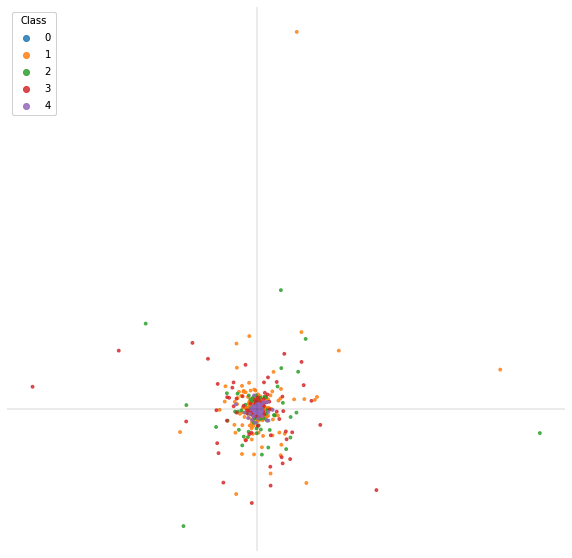

In [114]:
# slighly rewrite imports for ease of use
from sklearn.decomposition import PCA
from sklearn.manifold import LocallyLinearEmbedding, Isomap, TSNE
import umap

# example showing PCA of features
fig, ax = plt.subplots(figsize=(10, 10))

# create a PCA object
pca = PCA(n_components=2)

# transform every fifth vector (to save computation time)
# some techniques need this; others will be fast enough
subsample = 5
pca_X = pca.fit_transform(X[::subsample, :])

# show a scatter plot of the first two dimensions
scatter = ax.scatter(
    pca_X[:, 0],
    pca_X[:, 1],
    c=y[::subsample],
    cmap="tab10",
    vmin=0,
    vmax=10,
    alpha=0.8,
    s=8,
)
##### Make the figure look a bit cleaner
# Produce a legend for the ranking (colors). Even though there are 40 different
# rankings, we only want to show 5 of them in the legend.
legend1 = ax.legend(*scatter.legend_elements(num=4), loc="upper left", title="Class")
ax.add_artist(legend1)
ax.axhline(0, color="k", alpha=0.1)
ax.axvline(0, color="k", alpha=0.1)
ax.axis("off")

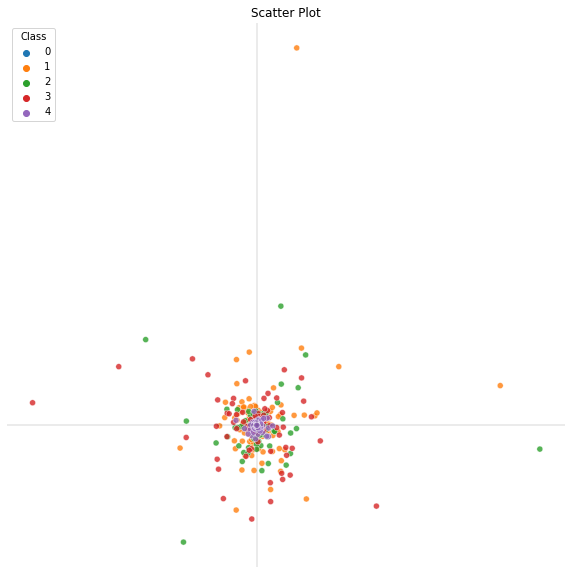

In [115]:

#Seaborn looks slightly nicer for plots, so it is used here
import seaborn as sns
# Helper function for plotting, no subsampling by default
def plot_2d_scatter(X_data, Y_data, y, subsample=1, title="Scatter Plot"):
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.scatterplot(
        x=X_data, y=Y_data,
        hue=y[::subsample],
        alpha=0.8,
        palette=sns.color_palette('tab10',5),
        legend="full",
    )
    ax.axhline(0, color="k", alpha=0.1)
    ax.axvline(0, color="k", alpha=0.1)
    ax.set_title(title)
    ax.legend(title="Class",loc='upper left')
    ax.axis("off")
    
# plot the same plot, but using seaborn
plot_2d_scatter(pca_X[:,0], pca_X[:,1],y,5)

In [111]:
# We can actually plot the full dataset without any subsampling
def run_show_PCA(X, y, subsample=1, title="Scatter Plot"):
    pca_X = pca.fit_transform(X[::subsample, :])
    plot_2d_scatter(pca_X[:,0], pca_X[:,1], y, subsample, title)
run_show_PCA(X,y)

KeyboardInterrupt: 

We can see that there is little separation between each class, we cannot even see Class 0, after zooming in we can see that it is clustered around the centre along with other classes. Class 4 is clustered only around the centre, but 1,2 and 3 are all over the plot.

We can try plotting PCA in 3D

In [83]:
# # for interactive graph, needs ipympl installed
# %matplotlib widget
# from matplotlib.colors import ListedColormap
# pca_3 = PCA(n_components = 3)
# pca_3X = pca_3.fit_transform(X)

# fig = plt.figure(figsize=(8,8))
# ax = fig.add_subplot(111, projection='3d')

# ax.set_xlabel("PCA 1")
# ax.set_ylabel("PCA 2")
# ax.set_zlabel("PCA 3")
# # colour_map = plt.cm.get_cmap('tab10')
# cmap = ListedColormap(sns.color_palette("tab10", 5).as_hex())
# # print(np.unique(y))
# ax.scatter(xs=pca_3X[:,0],
#            ys=pca_3X[:,1],
#            zs=pca_3X[:,2],
#            c=y,
#            cmap=cmap
#           )
# legend1 = ax.legend(*scatter.legend_elements(num=4), title="Class")
# ax.add_artist(legend1)

3D scatter of PCA does not show any clear structure as well<img src="imgs/3d scatter.png"> Let's try LLE,ISOMAP, tSNE and UMAP

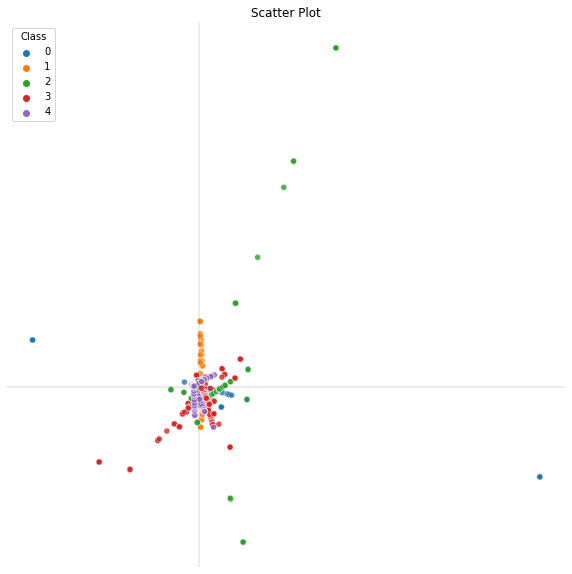

In [463]:
def run_show_LLE(X, y, subsample=1, title="Scatter Plot"):
    X_lle = LocallyLinearEmbedding(n_components=2,eigen_solver='dense').fit_transform(X[::subsample, :])
    plot_2d_scatter(X_lle[:,0], X_lle[:,1],y,subsample, title)
run_show_LLE(X,y,5)

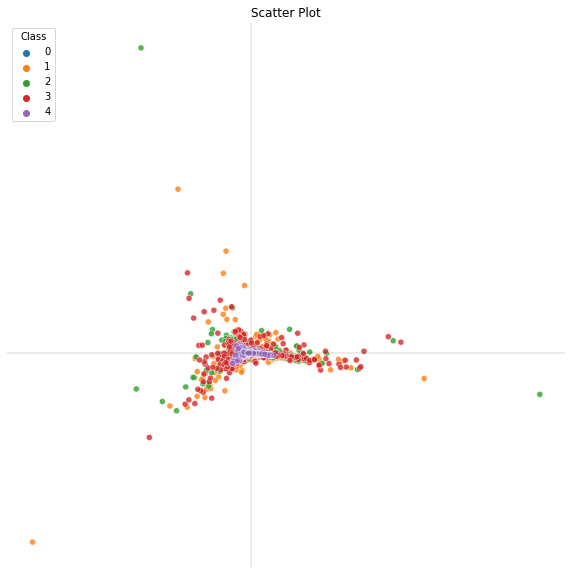

In [101]:
def run_show_ISO(X, y, subsample=1, title="Scatter Plot"):
    X_iso = Isomap(n_components=2).fit_transform(X[::subsample, :])
    plot_2d_scatter(X_iso[:,0], X_iso[:,1],y,subsample, title)
run_show_ISO(X,y,5)

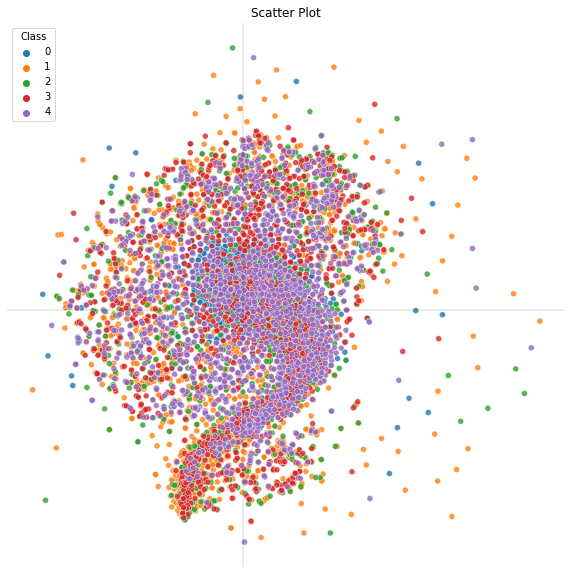

In [102]:
def run_show_TSNE(X, y, subsample=1, title="Scatter Plot"):
    X_tsne = TSNE(n_components=2).fit_transform(X[::subsample, :])
    plot_2d_scatter(X_tsne[:,0], X_tsne[:,1],y,subsample, title)
run_show_TSNE(X,y,5)

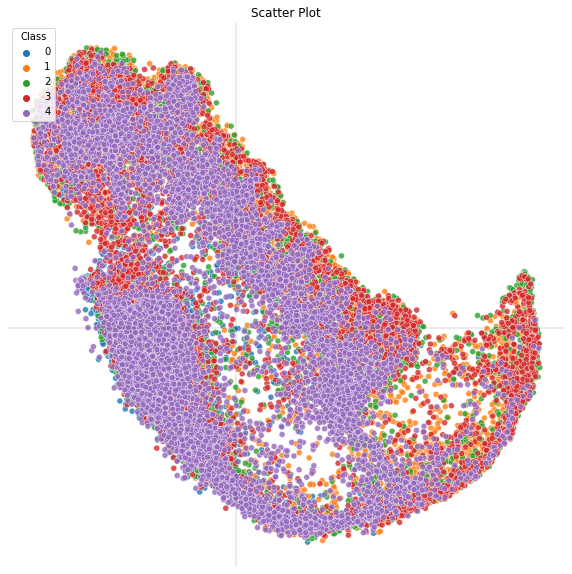

In [103]:
def run_show_UMAP(X, y, subsample=1, title="Scatter Plot"):
    X_umap  = umap.UMAP().fit_transform(X[::subsample, :])
    plot_2d_scatter(X_umap[:,0], X_umap[:,1],y,subsample, title)
run_show_UMAP(X, y, 1)

In [465]:
def plot_all(X,y,subsample, title="" ):
    run_show_PCA(X, y, subsample,"PCA "+title)
    run_show_LLE(X, y, subsample,"LLE "+title)
    run_show_ISO(X, y, subsample,"ISO "+title)
    run_show_TSNE(X, y, subsample,"TSNE "+title)
    run_show_UMAP(X, y, subsample,"UMAP "+title)

No clear seperation in any of the plots, although TSNE seems to give pretty good variance, lets adjust the parameters. Right now step size is half of window size, which means that there is a lot of overlap, let's try reducing it.

In [104]:
######### PARAMETERS ##################
# You can change these values
# 1 sample = 1/4096 of a second

parameters = {
'size':256, # how long each window is, in samples
'step':128, # how many samples to move forward in each window
'decimate':1, # how much reduction of the feature vector to perform; integer = 1,2,3,4,5...
'feature_range' :(0.0, 1.0), # what slice of the feature vectors to take (0.0, 1.0)=whole vector
# must be between 0.0 and 1.0 for the start and end 
'window_fn':"boxcar", # one of window_fns (below)
'feature_fn':"raw" # one of feature_fns    
}
#####################################

# valid feature_fns: ['dct', 'fft', 'fft_phase', 'dct_phase', 'cepstrum', 'raw'])
# valid window_fns: ['hamming', 'hann', 'boxcar', 'blackmanharris']

# X, y = audio_task.load_data(parameters)
# print(X.shape, y.shape)

Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using raw transform and a boxcar window.
Loading into 561 windows of length 256
Loading into 1316 windows of length 256
Loading into 1130 windows of length 256
Loading into 1600 windows of length 256
Loading into 1551 windows of length 256
Using raw transform and a boxcar window.
Loading into 467 windows of length 256
Loading into 1096 windows of length 256
Loading into 942 windows of length 256
Loading into 1333 windows of length 256
Loading into 1293 windows of length 256
Using raw transform and a boxcar window.
Loading into 401 windows of length 256
Loading into 940 windows of length 256
Loading into 808 windows of length 256
Loading into 1143 windows of length 256
Loading into 1108 windows of length 256
Using raw transform and a boxcar window.
Loading into 351 windows of length 256
Load

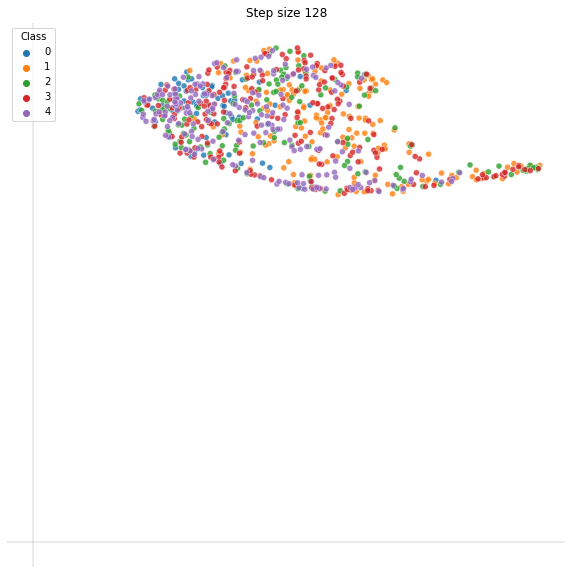

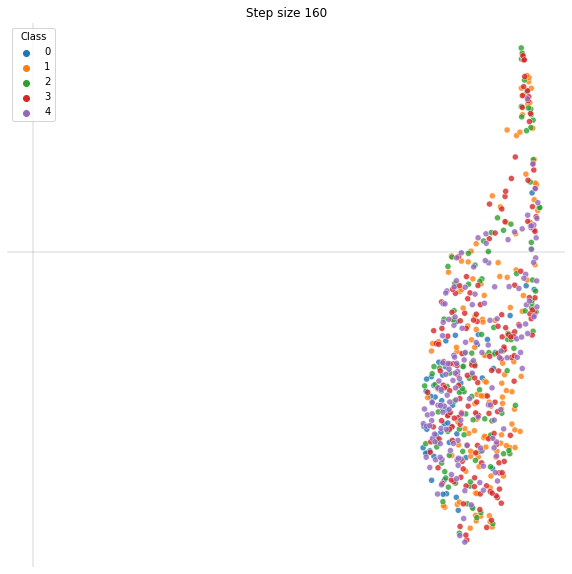

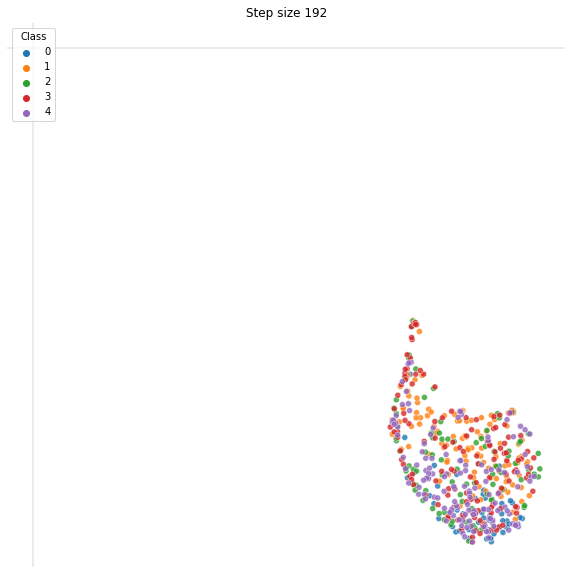

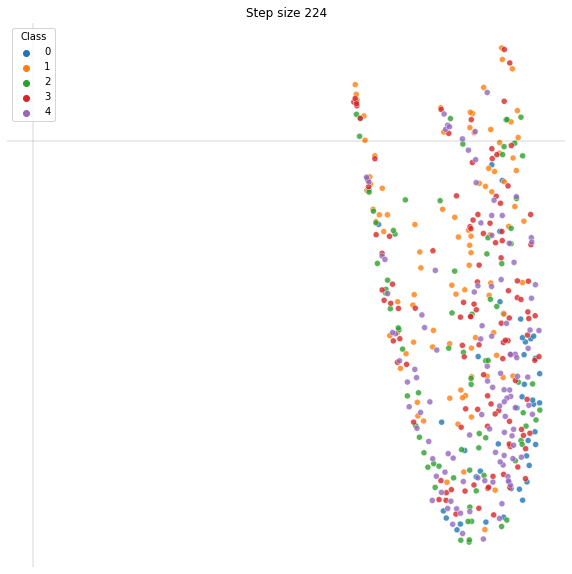

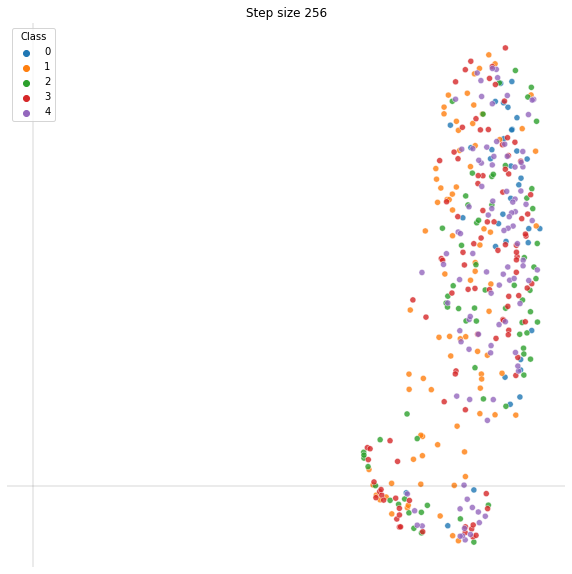

In [122]:
for i in range(128,257,32):
    parameters['step'] = i
    X, y = audio_task.load_data(parameters)
    run_show_UMAP(X,y,10,"Step size "+str(i))
    
          

The data only becomes more sparse, which is as expected, we can try increasing the size of the window itself since it is pretty small right now.

Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using raw transform and a boxcar window.
Loading into 699 windows of length 512
Loading into 1642 windows of length 512
Loading into 1411 windows of length 512
Loading into 1997 windows of length 512
Loading into 1937 windows of length 512
Using raw transform and a boxcar window.
Loading into 695 windows of length 1024
Loading into 1638 windows of length 1024
Loading into 1407 windows of length 1024
Loading into 1993 windows of length 1024
Loading into 1933 windows of length 1024
Using raw transform and a boxcar window.
Loading into 687 windows of length 2048
Loading into 1630 windows of length 2048
Loading into 1399 windows of length 2048
Loading into 1985 windows of length 2048
Loading into 1925 windows of length 2048
Using raw transform and a boxcar window.
Loading into 671 windows of le

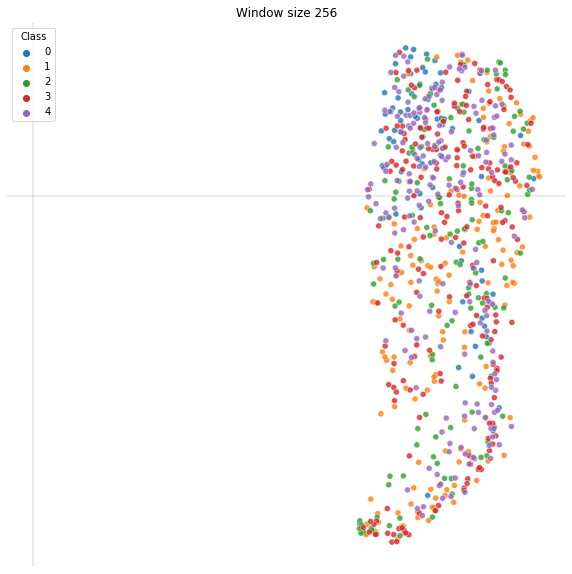

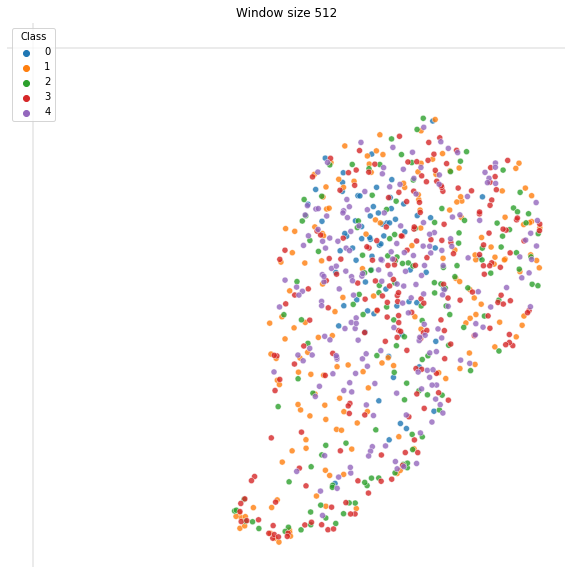

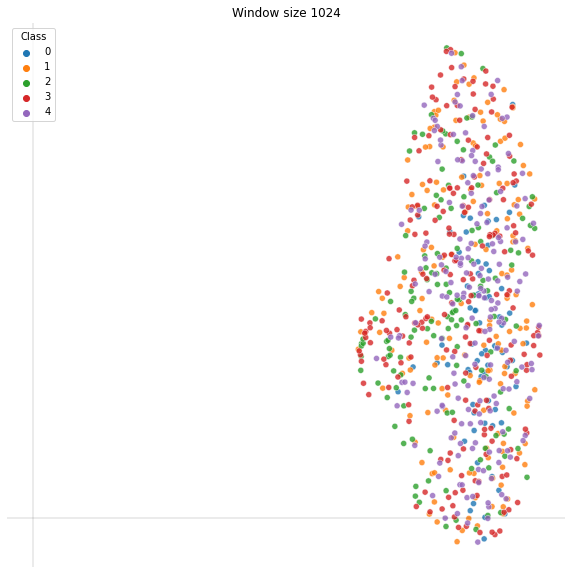

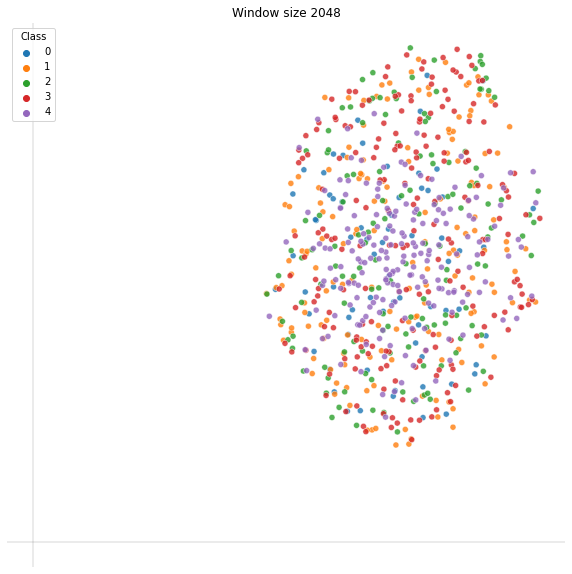

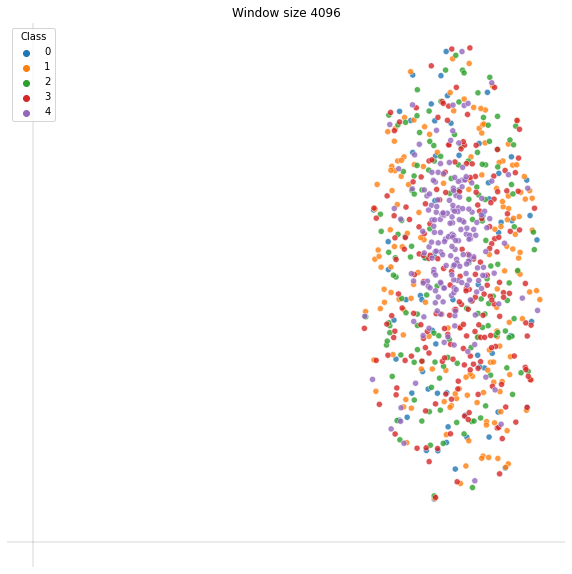

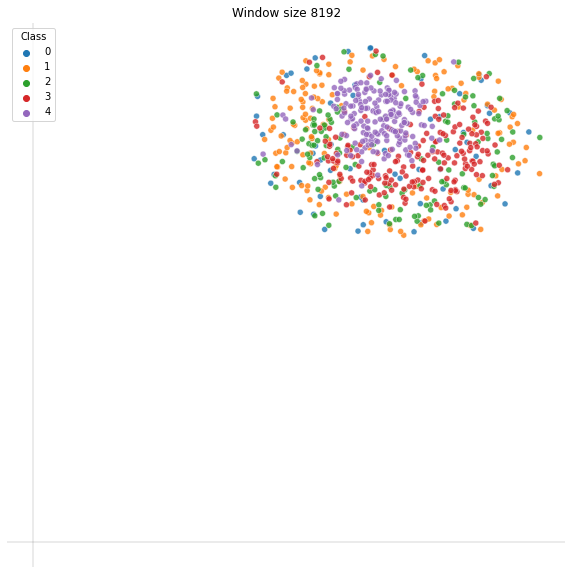

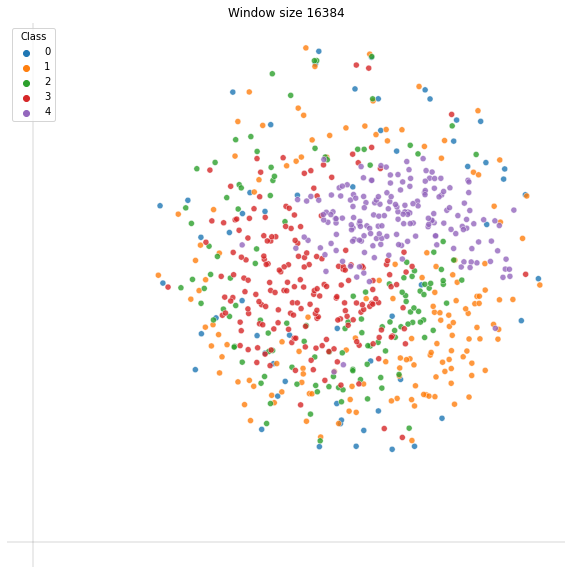

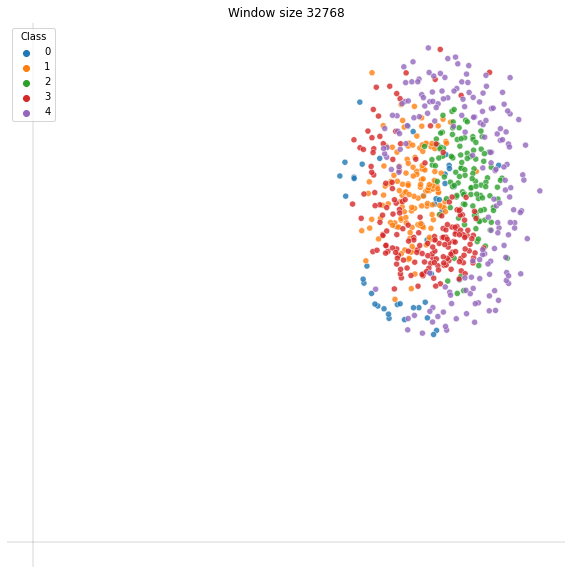

In [129]:
parameters['step']=128
i = 256
while i<=32768:
    parameters['size'] = i
    X, y = audio_task.load_data(parameters)
    run_show_UMAP(X,y,10,"Window size "+str(i))
    i = i*2

Larger values indeed give more separation, however thay don't need to be too large as that will lead to incorrect classification, lets stick to 4096 for now. Since we are currently using the most basic windowing let's try out different ones

Loading into 671 windows of length 4096
Loading into 1614 windows of length 4096
Loading into 1383 windows of length 4096
Loading into 1969 windows of length 4096
Loading into 1909 windows of length 4096
Using raw transform and a boxcar window.
Loading into 671 windows of length 4096
Loading into 1614 windows of length 4096
Loading into 1383 windows of length 4096
Loading into 1969 windows of length 4096
Loading into 1909 windows of length 4096
Using raw transform and a hamming window.
Loading into 671 windows of length 4096
Loading into 1614 windows of length 4096
Loading into 1383 windows of length 4096
Loading into 1969 windows of length 4096
Loading into 1909 windows of length 4096
Using raw transform and a hann window.
Loading into 671 windows of length 4096
Loading into 1614 windows of length 4096
Loading into 1383 windows of length 4096
Loading into 1969 windows of length 4096
Loading into 1909 windows of length 4096
Using raw transform and a blackmanharris window.


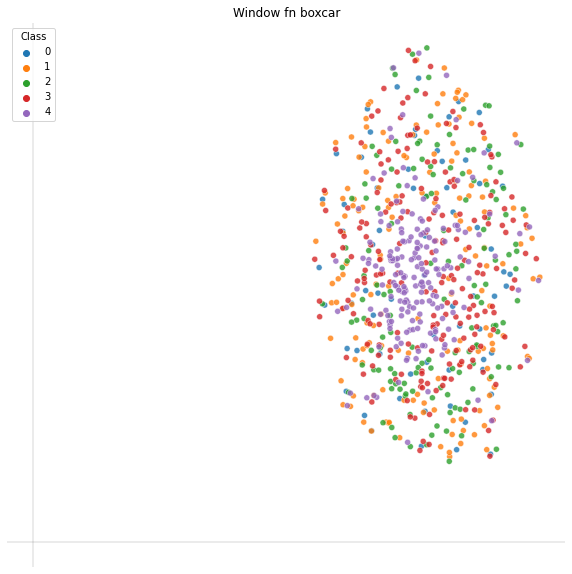

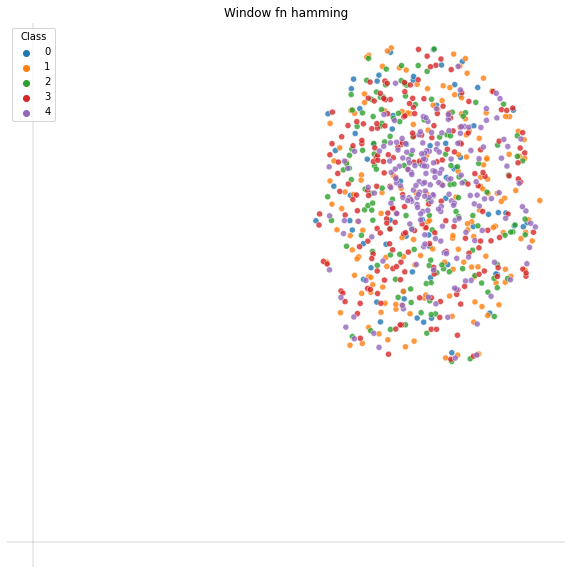

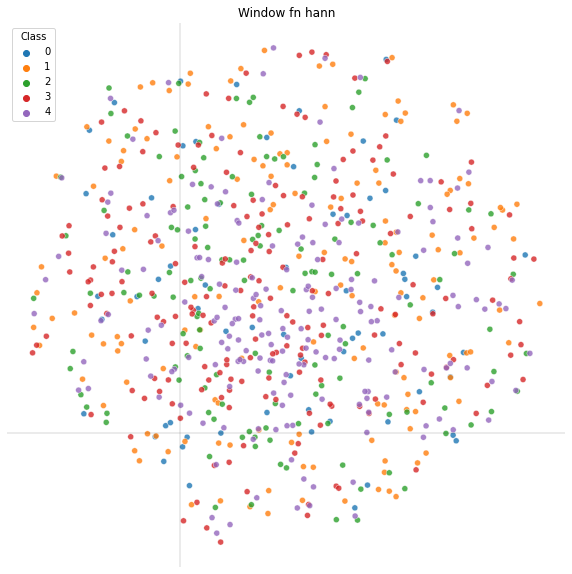

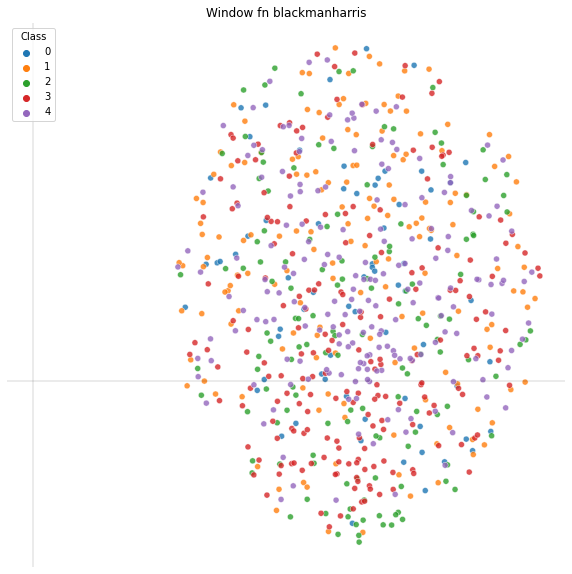

In [149]:
# valid window_fns: ['hamming', 'hann', 'boxcar', 'blackmanharris']
def test_window_UMAP(subsample = 10):
    parameters['window_fn'] = 'boxcar'
    X, y = audio_task.load_data(parameters)
    run_show_UMAP(X,y,subsample,"Window fn "+'boxcar')

    parameters['window_fn'] = 'hamming'
    X, y = audio_task.load_data(parameters)
    run_show_UMAP(X,y,subsample,"Window fn "+'hamming')

    parameters['window_fn'] = 'hann'
    X, y = audio_task.load_data(parameters)
    run_show_UMAP(X,y,subsample,"Window fn "+'hann')

    parameters['window_fn'] = 'blackmanharris'
    X, y = audio_task.load_data(parameters)
    run_show_UMAP(X,y,subsample,"Window fn "+'blackmanharris')
    
parameters['size']=4096
parameters['step']=128    
test_window_UMAP()

Other methods don't look any better, what if we increase the step size?

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using raw transform and a boxcar window.
Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using raw transform and a hamming window.
Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using raw transform and a hann window.
Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using raw transform and a blackmanharris window.


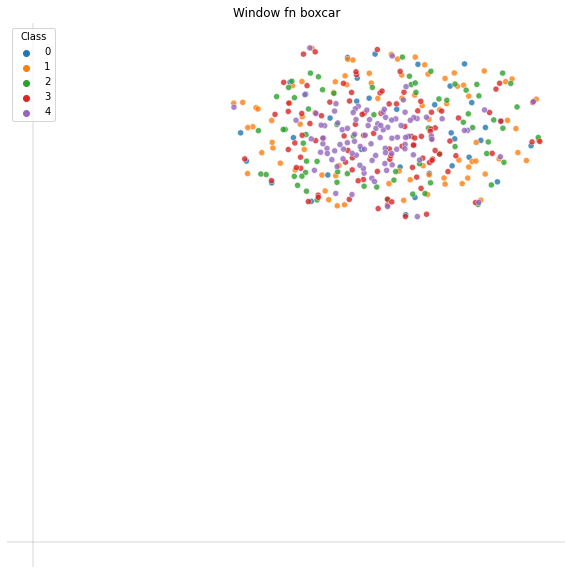

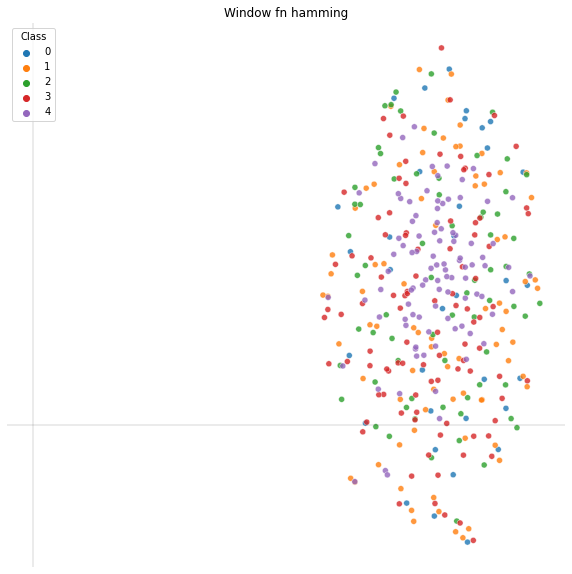

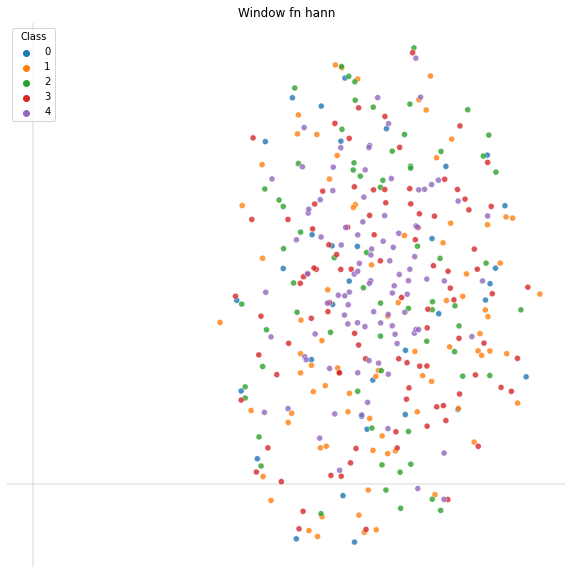

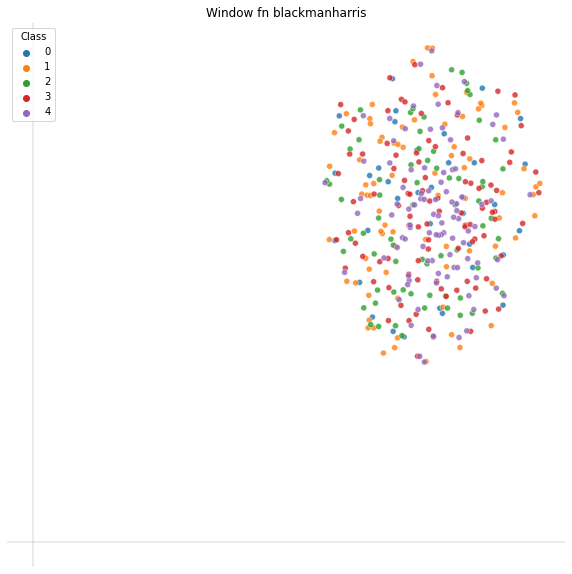

In [150]:
parameters['size']=4096
parameters['step']=256    
test_window_UMAP()

Does not seem to change anything, lets try plotting all represenations of the different feature functions

In [160]:
parameters['window_fn'] = 'boxcar'
parameters['size']=4096
parameters['step']=256

Loading into 671 windows of length 4096
Loading into 1614 windows of length 4096
Loading into 1383 windows of length 4096
Loading into 1969 windows of length 4096
Loading into 1909 windows of length 4096
Using raw transform and a boxcar window.
(7546, 4096) (7546,)


Loading into 671 windows of length 4096
Loading into 1614 windows of length 4096
Loading into 1383 windows of length 4096
Loading into 1969 windows of length 4096
Loading into 1909 windows of length 4096
Using raw transform and a boxcar window.
Loading into 671 windows of length 4096
Loading into 1614 windows of length 4096
Loading into 1383 windows of length 4096
Loading into 1969 windows of length 4096
Loading into 1909 windows of length 4096
Using dct transform and a boxcar window.
Loading into 671 windows of length 4096
Loading into 1614 windows of length 4096
Loading into 1383 windows of length 4096
Loading into 1969 windows of length 4096
Loading into 1909 windows of length 4096
Using fft transform and a boxcar window.
Loading into 671 windows of length 4096
Loading into 1614 windows of length 4096
Loading into 1383 windows of length 4096
Loading into 1969 windows of length 4096
Loading into 1909 windows of length 4096
Using fft_phase transform and a boxcar window.
Loading into 6

<ipython-input-115-9dd471326022>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 10))


Loading into 671 windows of length 4096
Loading into 1614 windows of length 4096
Loading into 1383 windows of length 4096
Loading into 1969 windows of length 4096
Loading into 1909 windows of length 4096
Using cepstrum transform and a boxcar window.


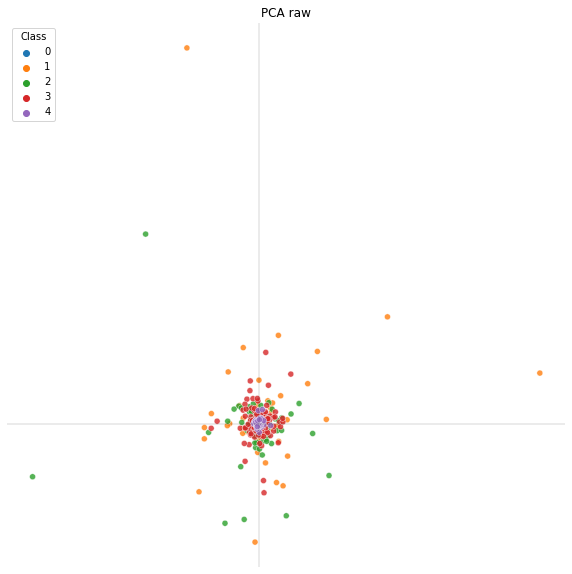

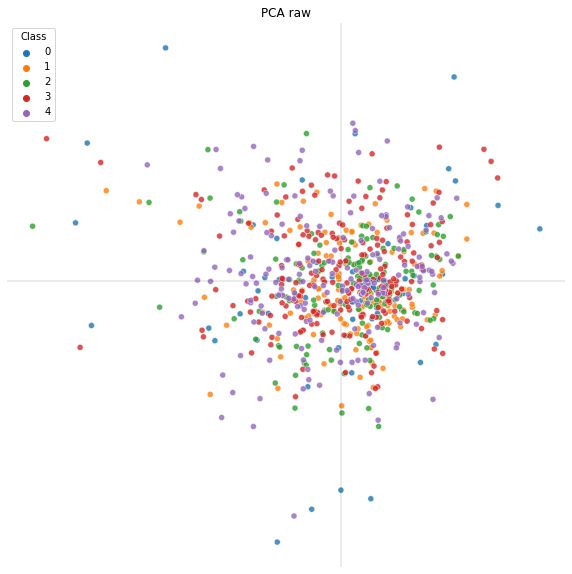

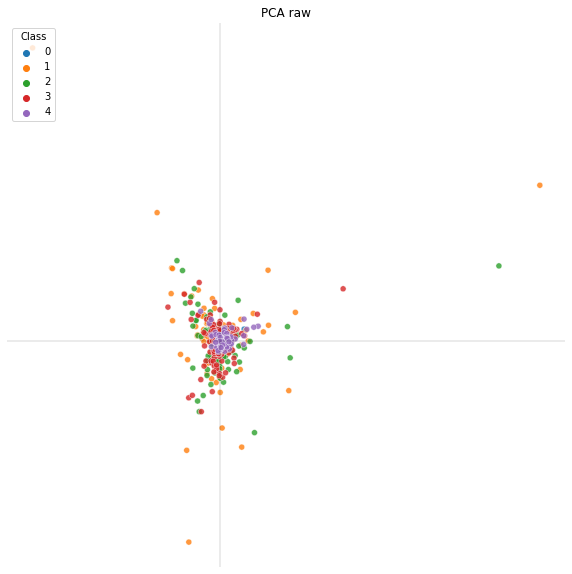

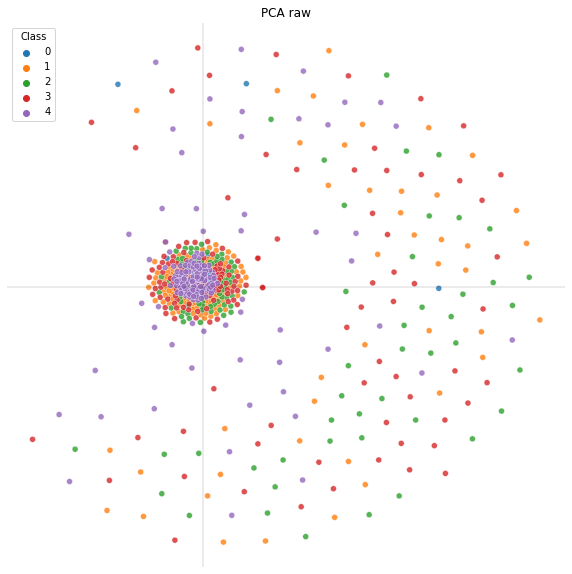

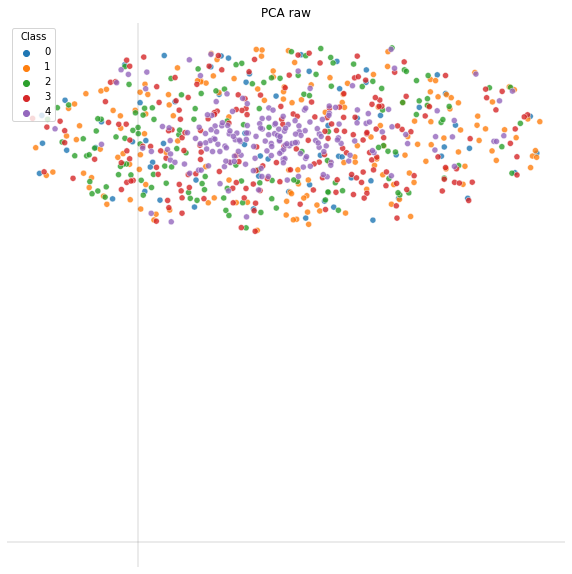

...

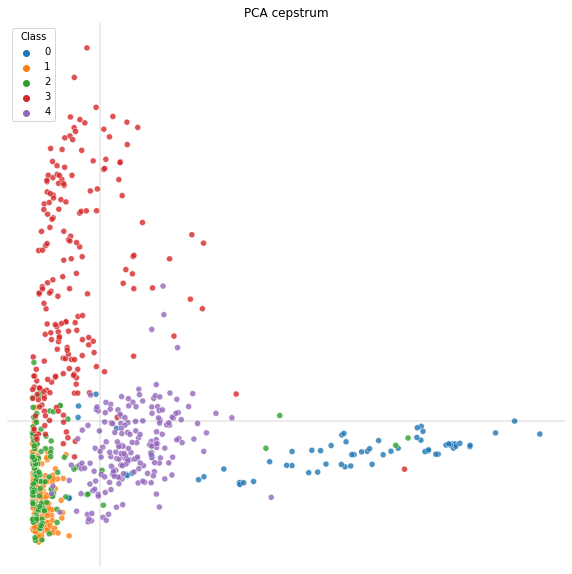

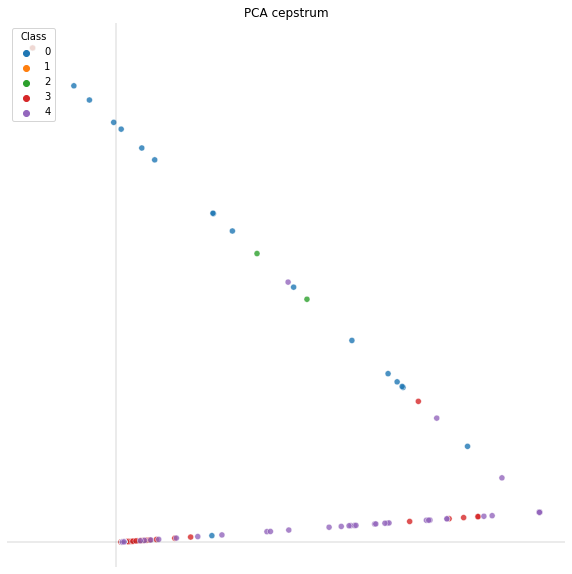

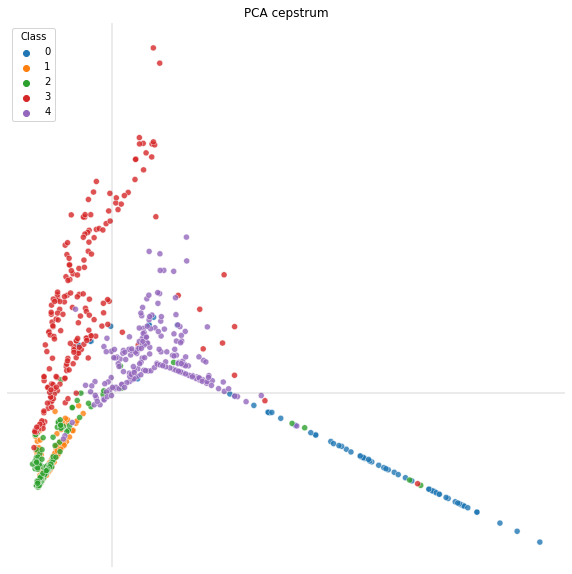

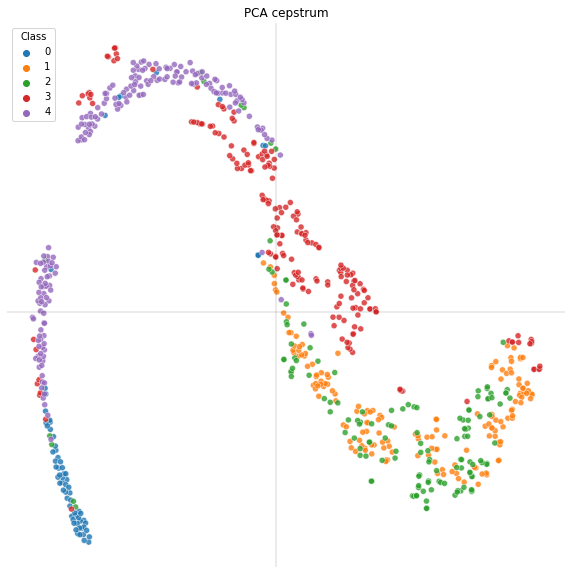

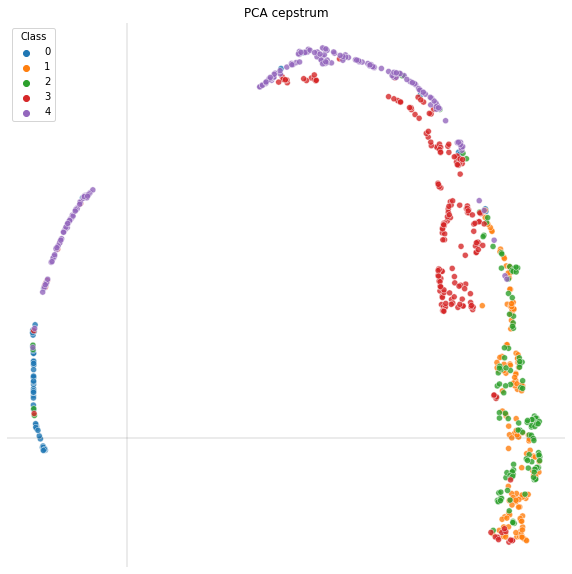

In [163]:
# valid feature_fns: ['dct', 'fft', 'fft_phase', 'dct_phase', 'cepstrum', 'raw'])

parameters['feature_fn'] = 'raw'
X, y = audio_task.load_data(parameters)
plot_all(X,y,10,"raw")

parameters['feature_fn'] = 'dct'
X, y = audio_task.load_data(parameters)
plot_all(X,y,10,"dct")

parameters['feature_fn'] = 'fft'
X, y = audio_task.load_data(parameters)
plot_all(X,y,10,"fft")

parameters['feature_fn'] = 'fft_phase'
X, y = audio_task.load_data(parameters)
plot_all(X,y,10,"fft_phase")

parameters['feature_fn'] = 'dct_phase'
X, y = audio_task.load_data(parameters)
plot_all(X,y,10,"dct_phase")

parameters['feature_fn'] = 'cepstrum'
X, y = audio_task.load_data(parameters)
plot_all(X,y,10,"cepstrum")

dct and fft seem to give the best seperation, lets use tsne with fft for now, class 3 sepearation is quite qood, though 2 is close to 1 and 4 is close to 0, there are some outliers of 0 as well.

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using fft transform and a boxcar window.


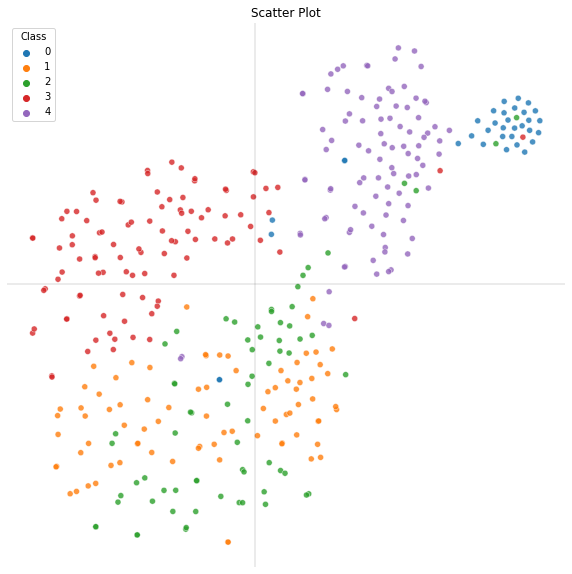

In [175]:
parameters = {
'size':4096, # how long each window is, in samples
'step':256, # how many samples to move forward in each window
'decimate':1, # how much reduction of the feature vector to perform; integer = 1,2,3,4,5...
'feature_range' :(0.0, 1.0), # what slice of the feature vectors to take (0.0, 1.0)=whole vector
# must be between 0.0 and 1.0 for the start and end 
'window_fn':"boxcar", # one of window_fns (below)
'feature_fn':"fft" # one of feature_fns    
}
X, y = audio_task.load_data(parameters)
run_show_TSNE(X,y,10)

Try reducing number of features

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using fft transform and a boxcar window.
X shape (3775, 2048) y shape (3775,)
Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using fft transform and a boxcar window.
X shape (3775, 1024) y shape (3775,)
Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using fft transform and a boxcar window.
X shape (3775, 683) y shape (3775,)
Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading

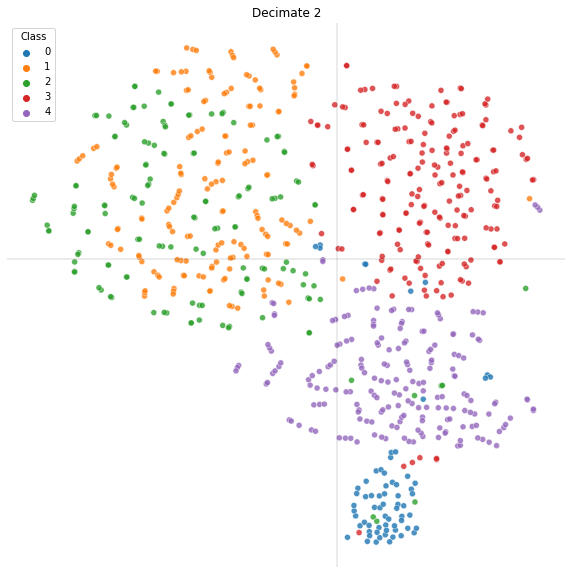

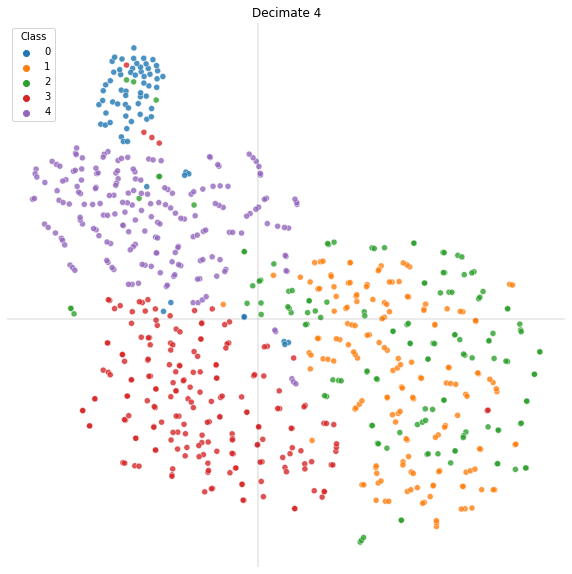

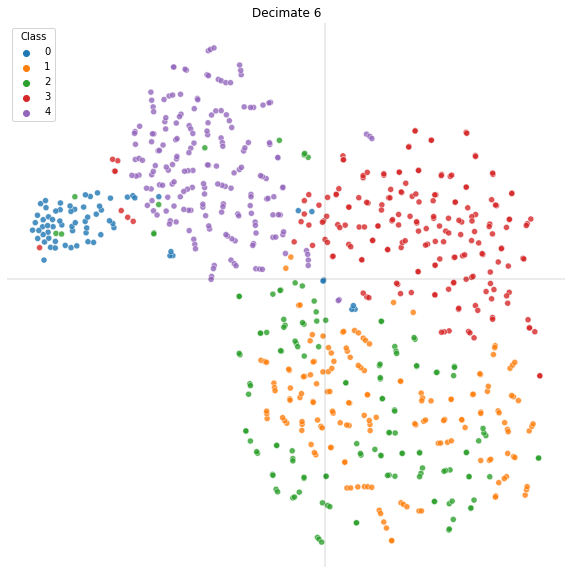

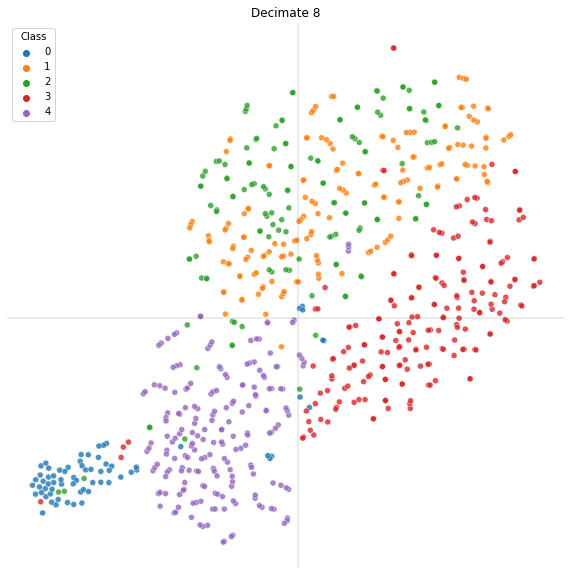

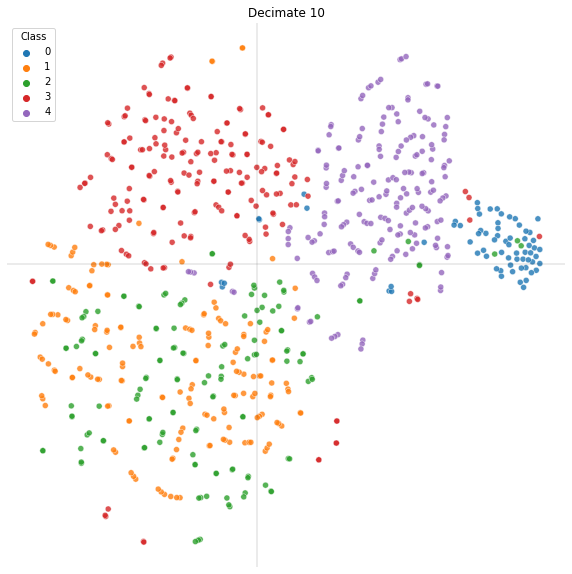

In [259]:
for i in range(2,11,2):
    parameters["decimate"] = i
    X, y = audio_task.load_data(parameters)
    print("X shape", X.shape, "y shape", y.shape)
    run_show_TSNE(X,y,5,"Decimate " + str(i))

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using fft transform and a boxcar window.
Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using fft transform and a boxcar window.
X shape (3775, 2048) y shape (3775,)
Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using fft transform and a boxcar window.
X shape (3775, 1024) y shape (3775,)
Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Usi

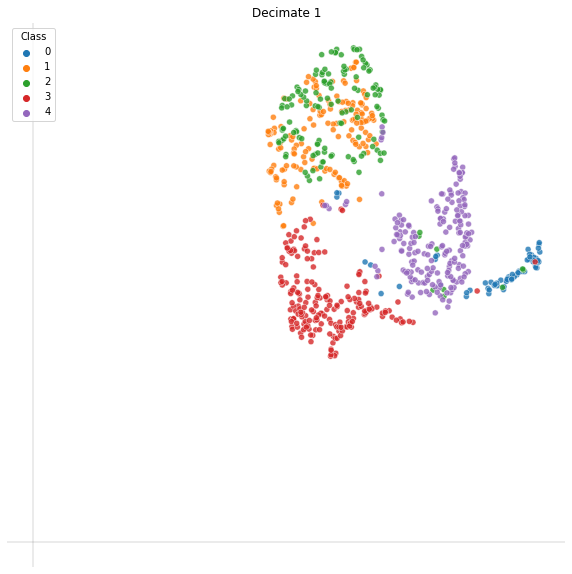

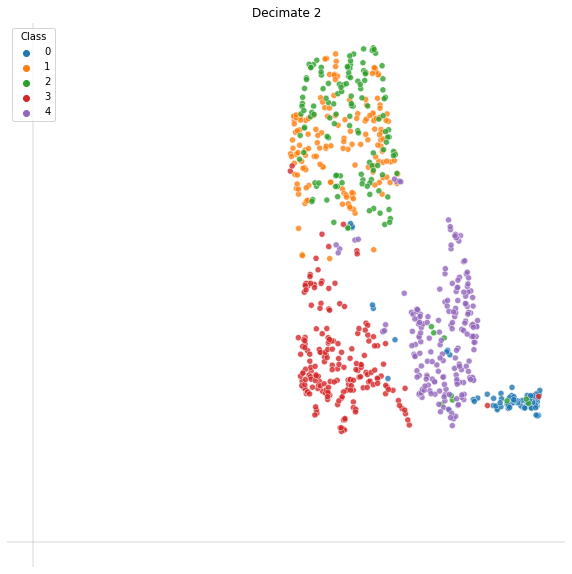

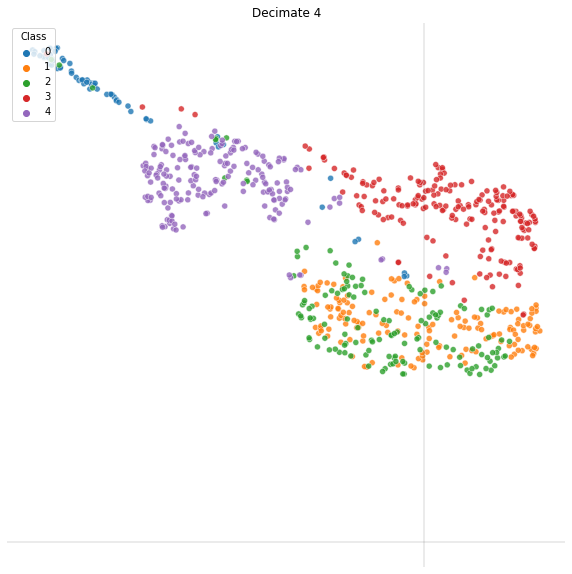

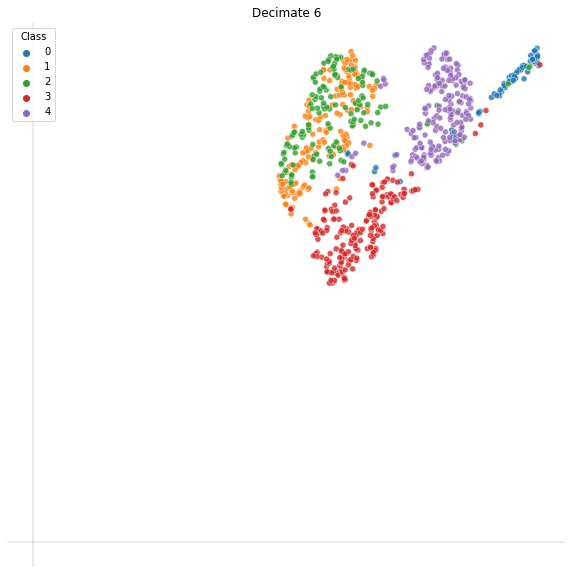

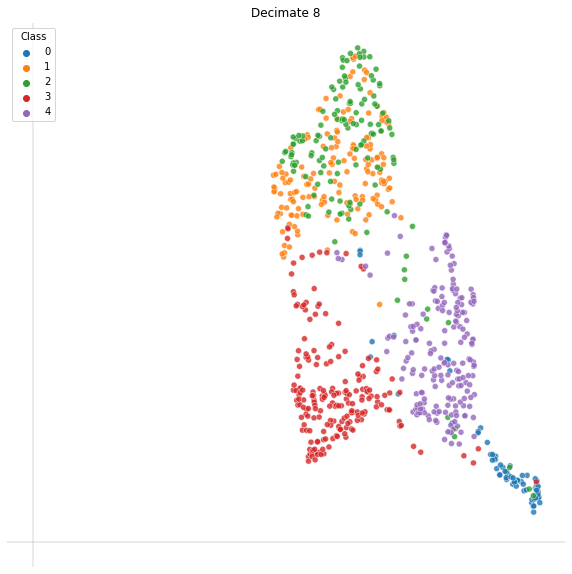

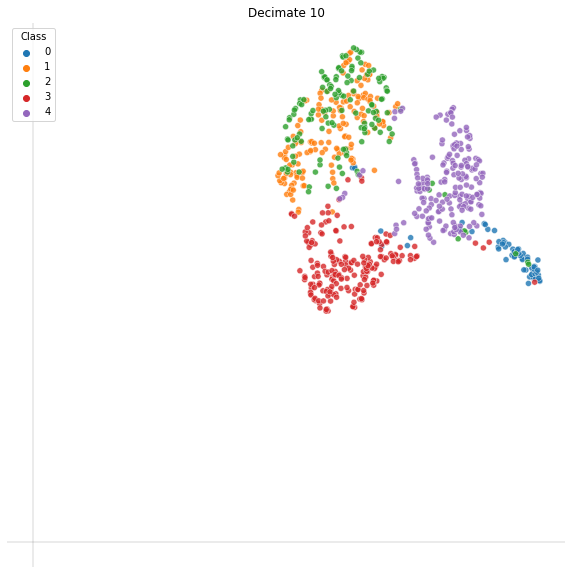

In [261]:
parameters["decimate"] = 1
X, y = audio_task.load_data(parameters)
run_show_UMAP(X,y,5,"Decimate 1")
for i in range(2,11,2):
    parameters["decimate"] = i
    X, y = audio_task.load_data(parameters)
    print("X shape", X.shape, "y shape", y.shape)
    run_show_UMAP(X,y,5,"Decimate " + str(i))

No change visible, but can use 4 since number of features is reduced.
try adjusting feature range

0.0 0.1
Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using fft transform and a boxcar window.
X shape (3775, 409) y shape (3775,)
0.0 0.30000000000000004
Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using fft transform and a boxcar window.
X shape (3775, 1228) y shape (3775,)
0.0 0.5
Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using fft transform and a boxcar window.
X shape (3775, 2048) y shape (3775,)
0.0 0.7
Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096

<ipython-input-115-9dd471326022>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 10))


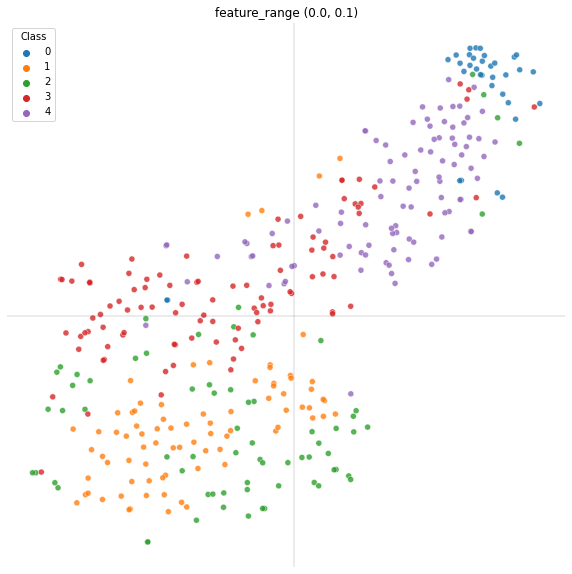

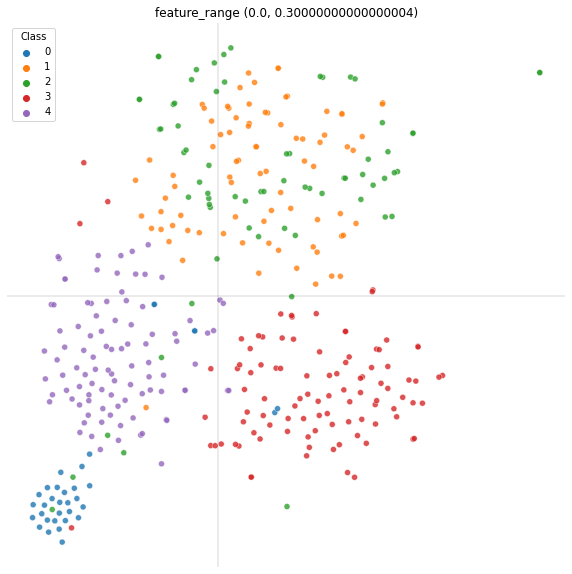

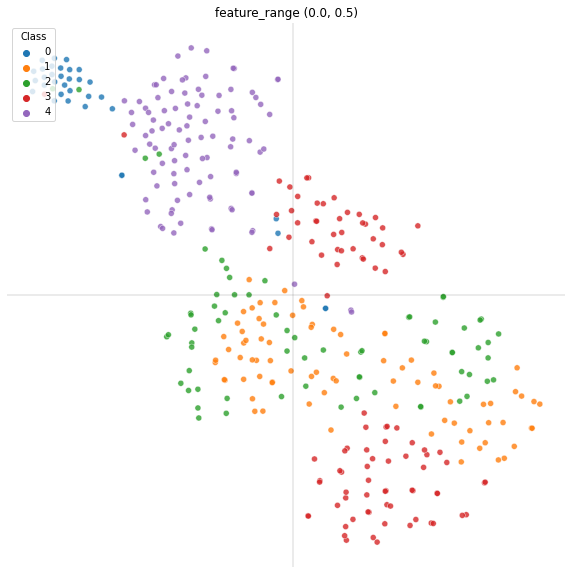

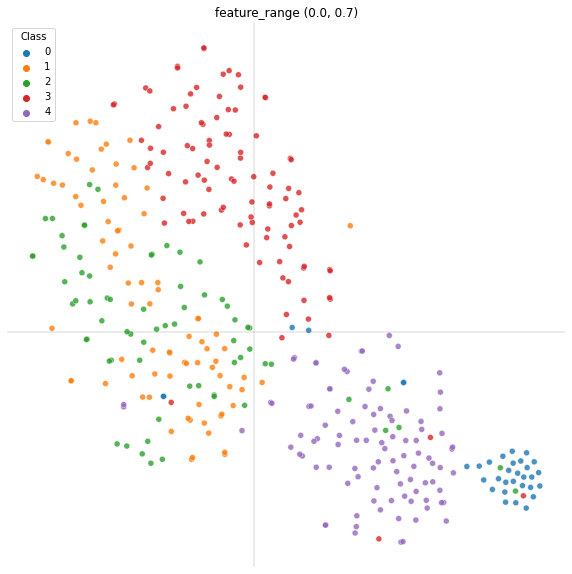

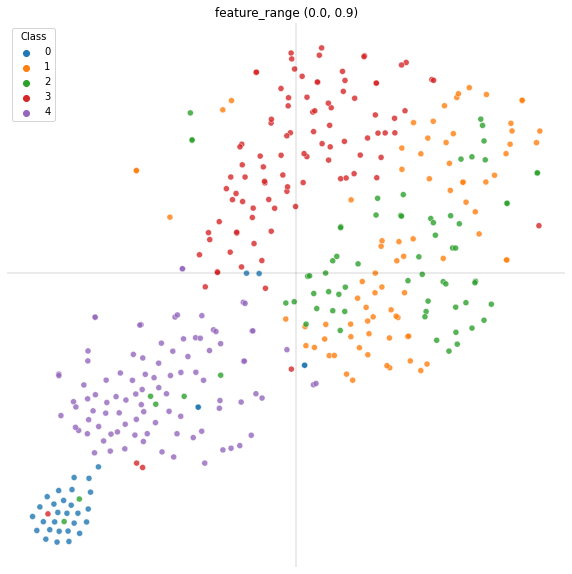

...

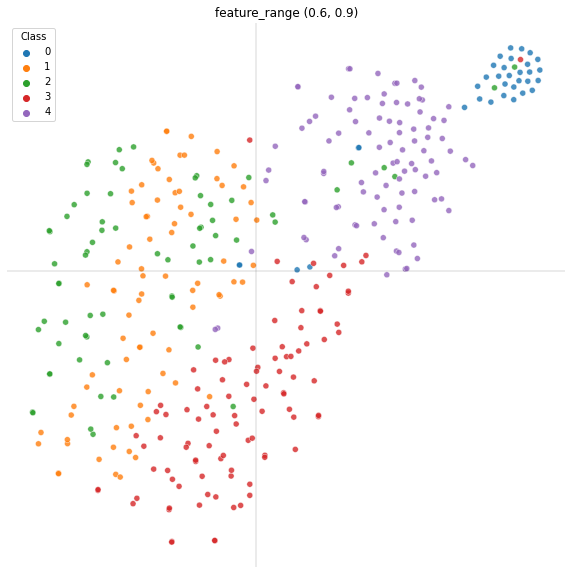

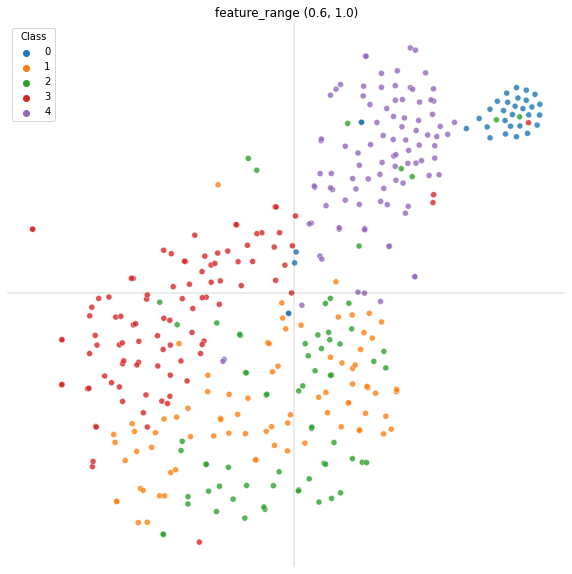

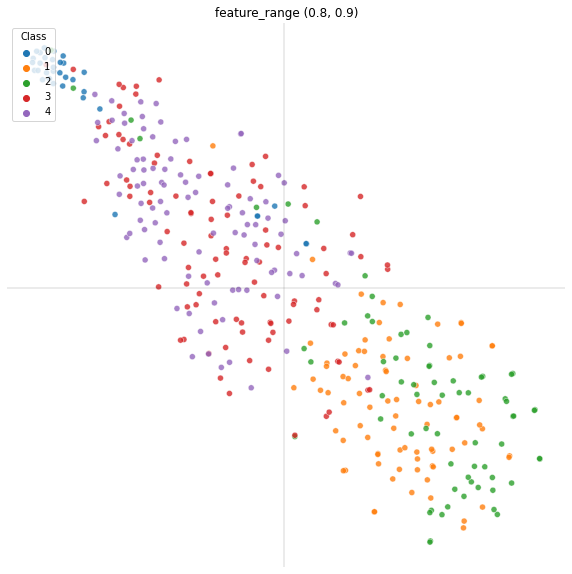

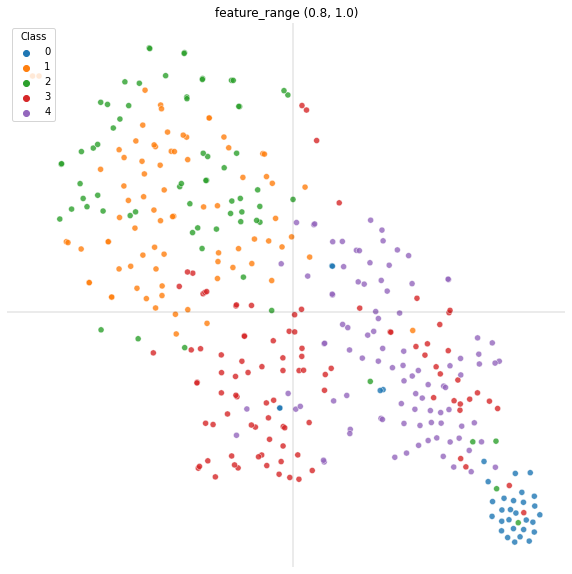

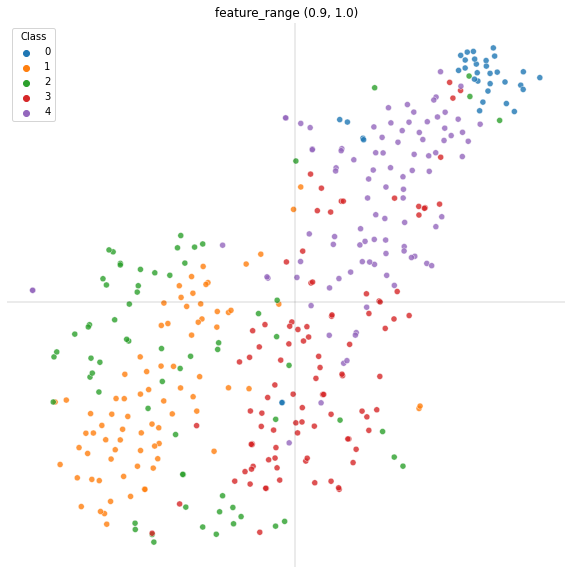

In [220]:
parameters = {
'size':4096, # how long each window is, in samples
'step':256, # how many samples to move forward in each window
'decimate':1, # how much reduction of the feature vector to perform; integer = 1,2,3,4,5...
'feature_range' :(0.0, 1), # what slice of the feature vectors to take (0.0, 1.0)=whole vector
# must be between 0.0 and 1.0 for the start and end 
'window_fn':"boxcar", # one of window_fns (below)
'feature_fn':"fft" # one of feature_fns    
}
for i in range(0,11,2):
    for a in range(i,11,2):
        range_min = min(i/10,0.9)
        range_max = min((a/10)+0.1,1.0)
        print(range_min,range_max)        
        parameters['feature_range']=(range_min,range_max)
        X, y = audio_task.load_data(parameters)
        print("X shape", X.shape, "y shape", y.shape)
        run_show_TSNE(X,y,10,"feature_range " + str((range_min,range_max)))


No clear improvement

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using fft transform and a boxcar window.


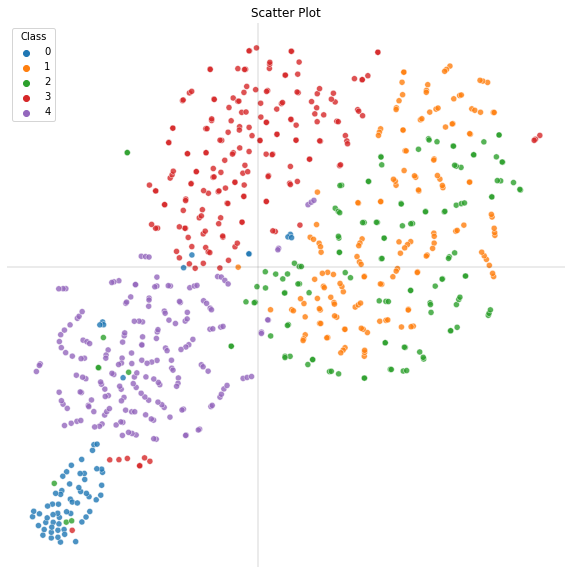

In [294]:

parameters['feature_range']=(0,1)
X, y = audio_task.load_data(parameters)
run_show_TSNE(X,y,5)


Try changing size again

Loading into 348 windows of length 1000
Loading into 820 windows of length 1000
Loading into 704 windows of length 1000
Loading into 997 windows of length 1000
Loading into 967 windows of length 1000
Using fft transform and a boxcar window.
Loading into 346 windows of length 1500
Loading into 818 windows of length 1500
Loading into 702 windows of length 1500
Loading into 995 windows of length 1500
Loading into 965 windows of length 1500
Using fft transform and a boxcar window.
Loading into 344 windows of length 2000
Loading into 816 windows of length 2000
Loading into 700 windows of length 2000
Loading into 993 windows of length 2000
Loading into 963 windows of length 2000
Using fft transform and a boxcar window.
Loading into 342 windows of length 2500
Loading into 814 windows of length 2500
Loading into 698 windows of length 2500
Loading into 991 windows of length 2500
Loading into 961 windows of length 2500
Using fft transform and a boxcar window.
Loading into 340 windows of length 3

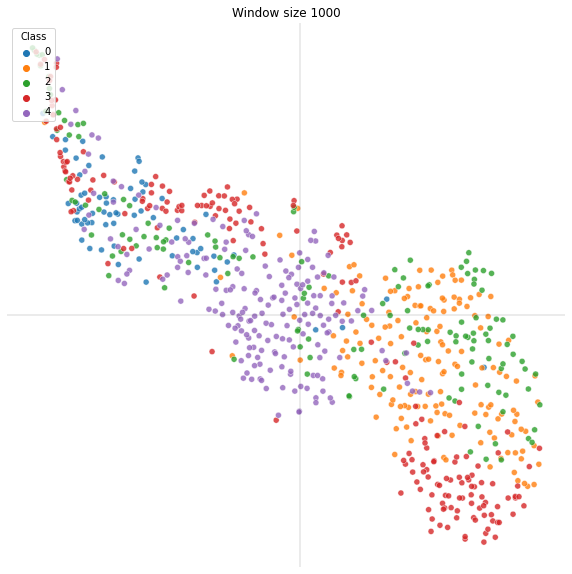

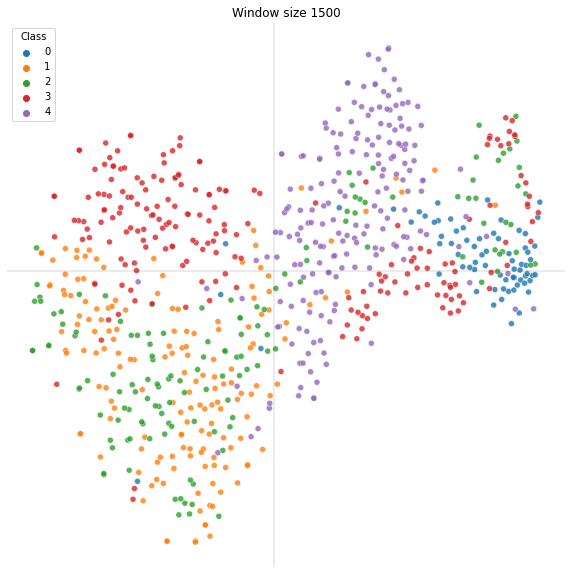

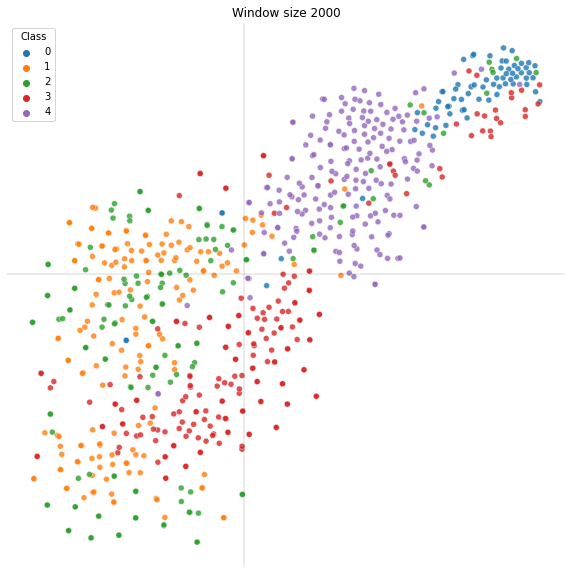

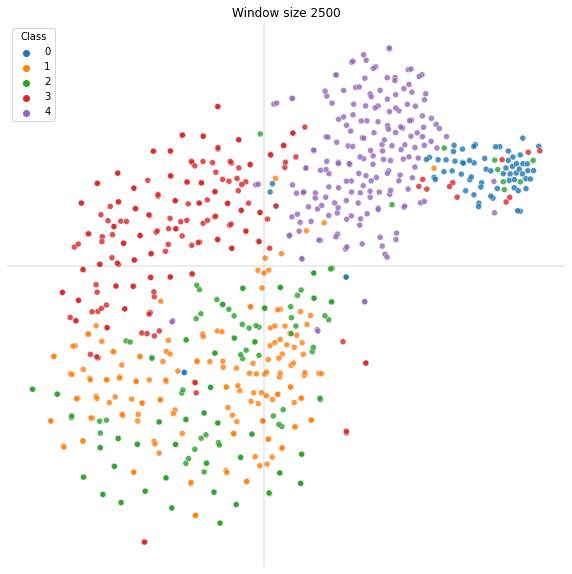

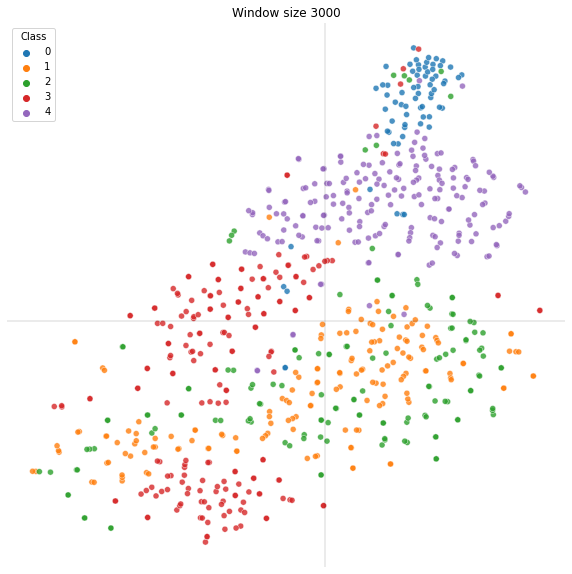

...

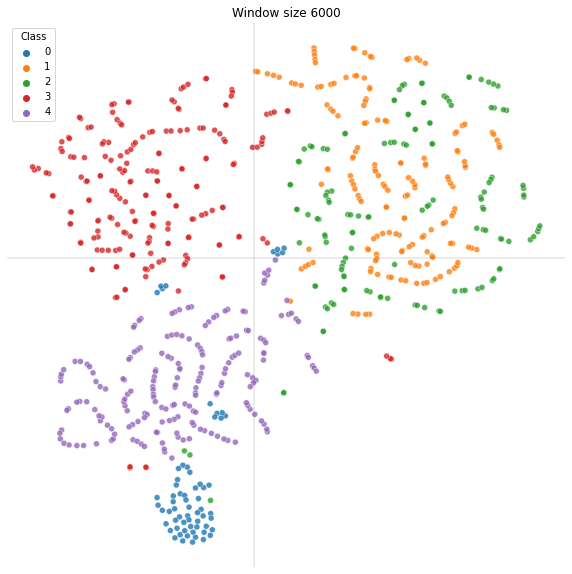

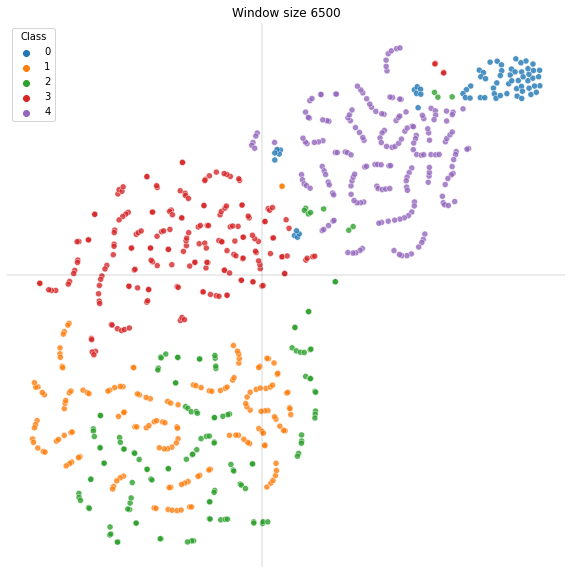

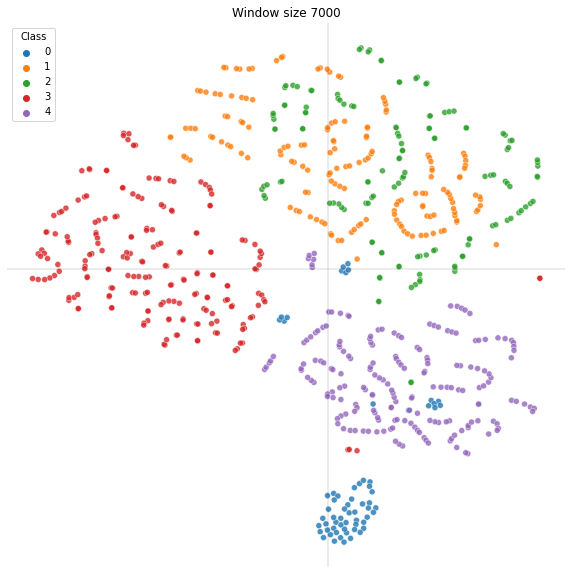

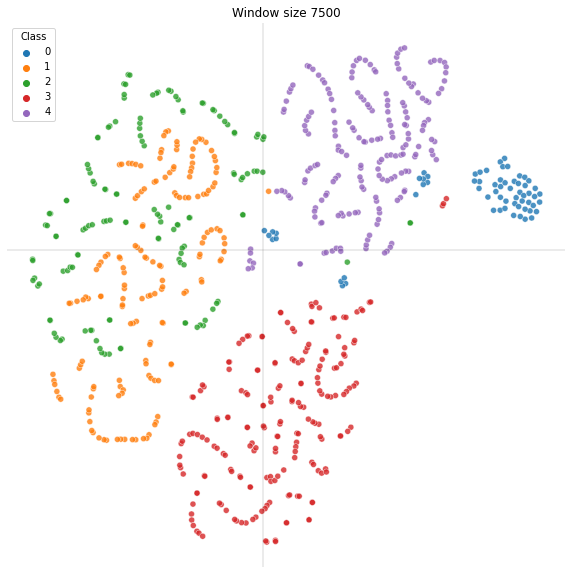

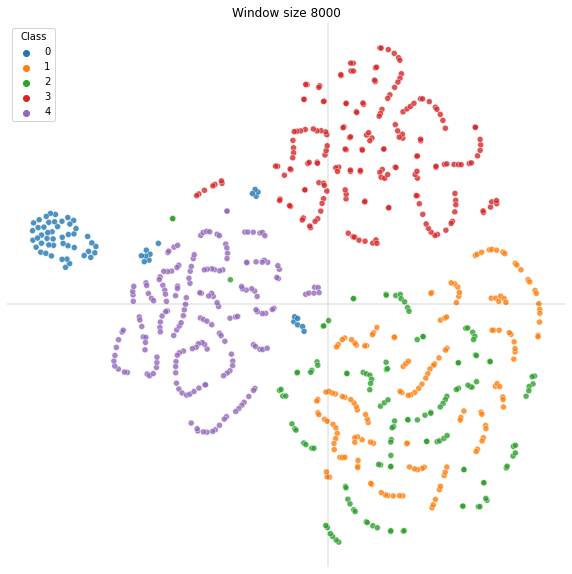

In [351]:
for i in range(1000,8001,500):
    parameters['size'] = i
    X, y = audio_task.load_data(parameters)
    run_show_TSNE(X,y,5,"Window size "+str(i))

Looks like higher values like 6000 provide better separation.
Try optimizing window step size for this size.

Loading into 1311 windows of length 6000
Loading into 3199 windows of length 6000
Loading into 2736 windows of length 6000
Loading into 3909 windows of length 6000
Loading into 3787 windows of length 6000
Using fft transform and a boxcar window.
Loading into 512 windows of length 6000
Loading into 1249 windows of length 6000
Loading into 1068 windows of length 6000
Loading into 1526 windows of length 6000
Loading into 1478 windows of length 6000
Using fft transform and a boxcar window.
Loading into 318 windows of length 6000
Loading into 776 windows of length 6000
Loading into 664 windows of length 6000
Loading into 948 windows of length 6000
Loading into 918 windows of length 6000
Using fft transform and a boxcar window.
Loading into 231 windows of length 6000
Loading into 563 windows of length 6000
Loading into 481 windows of length 6000
Loading into 688 windows of length 6000
Loading into 666 windows of length 6000
Using fft transform and a boxcar window.
Loading into 181 windows of

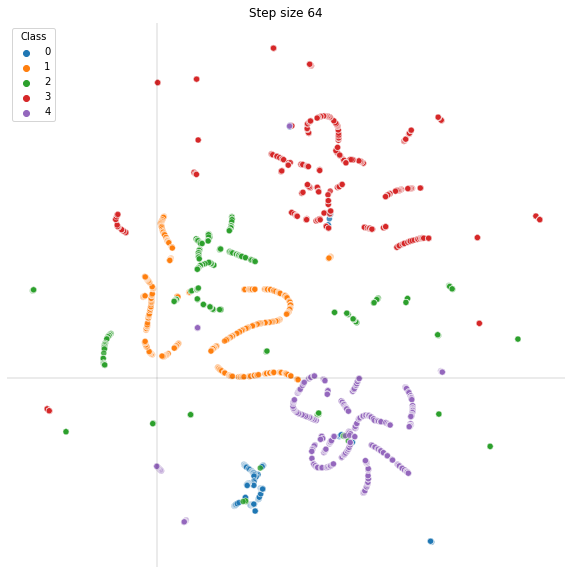

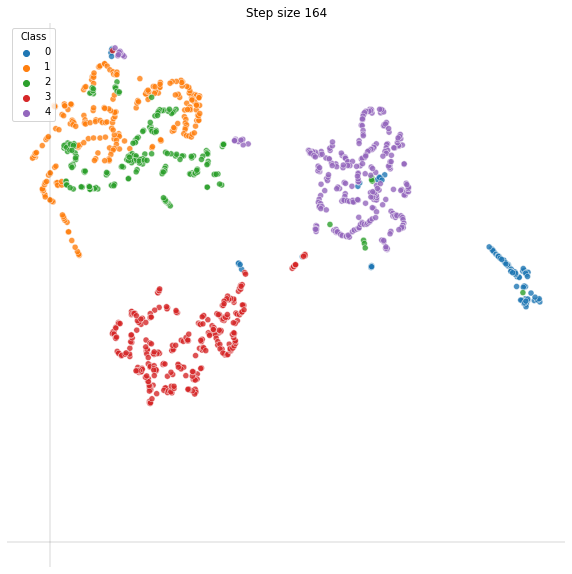

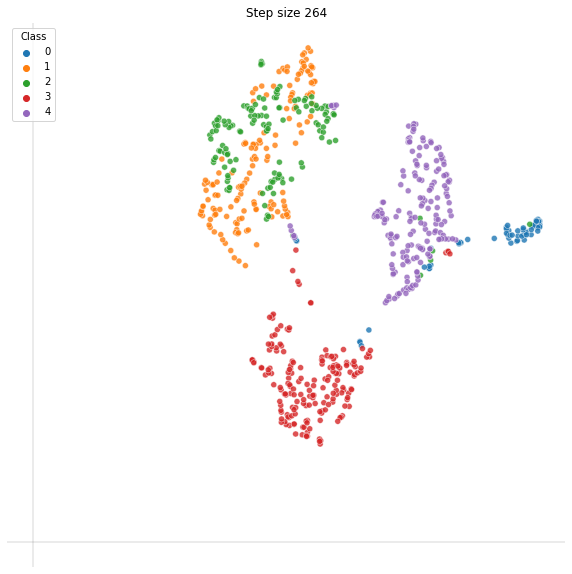

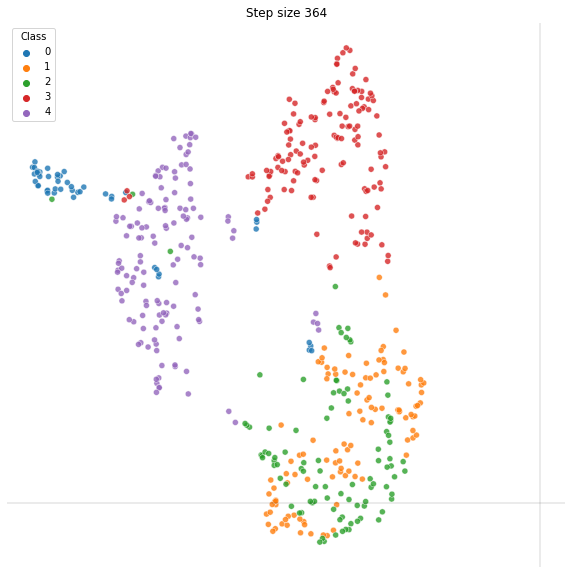

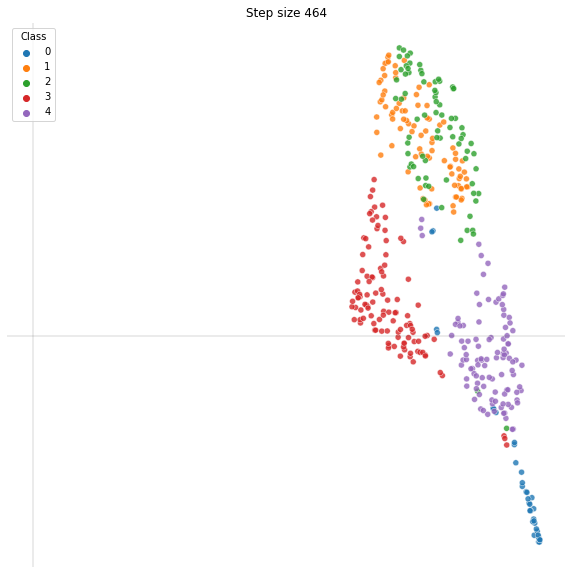

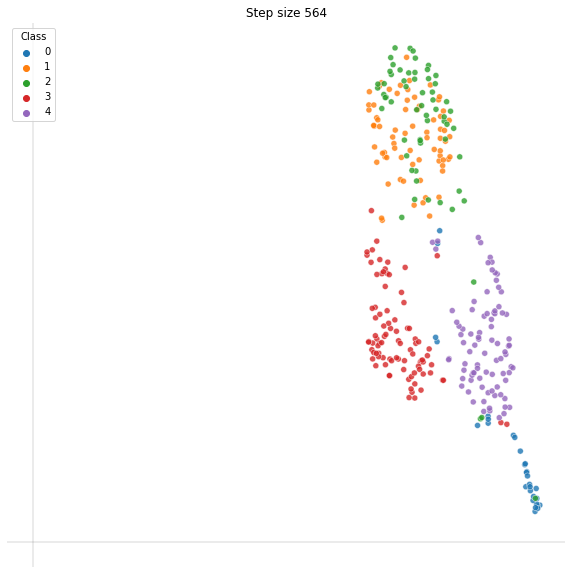

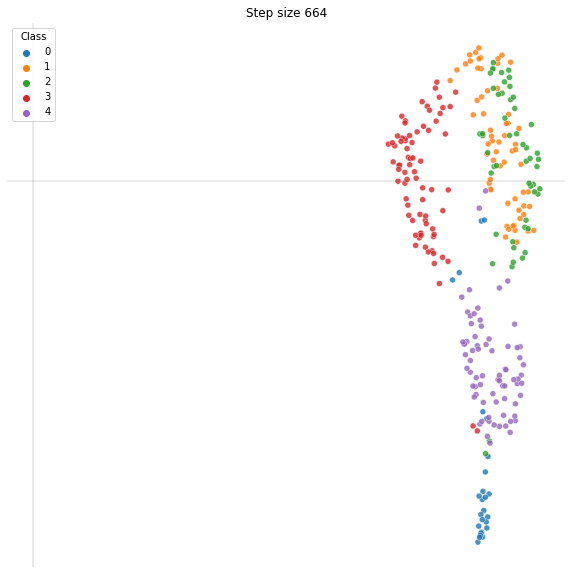

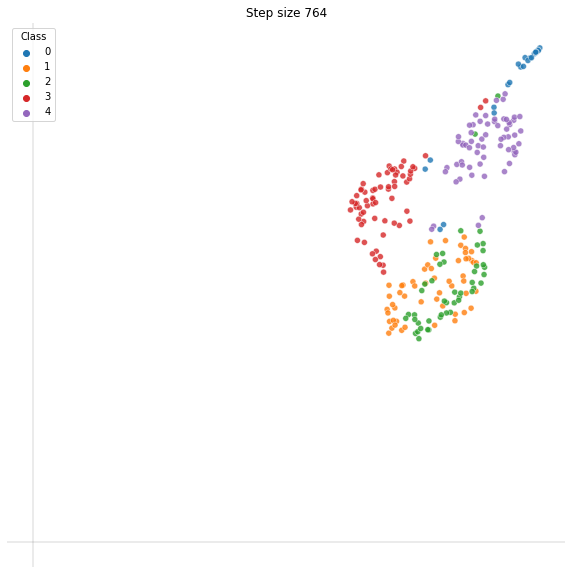

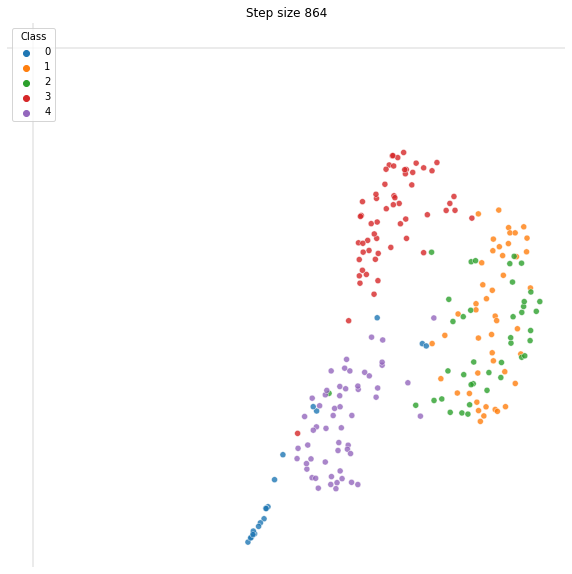

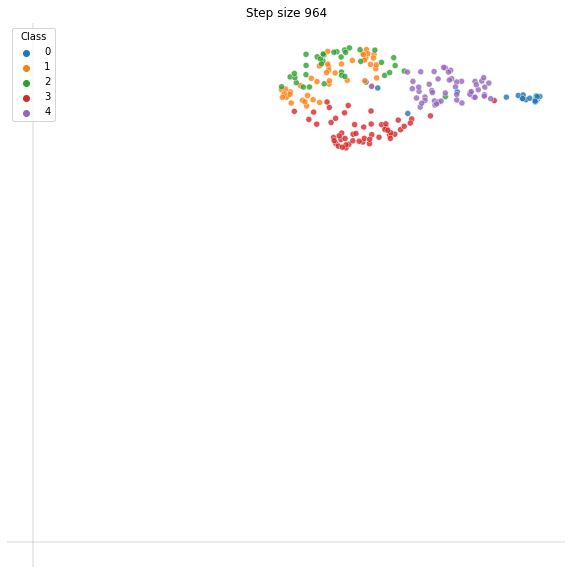

In [459]:
parameters['size'] = 6000

for i in range(64,1064,100):
    parameters['step'] = i
    X, y = audio_task.load_data(parameters)
    run_show_UMAP(X,y,5,"Step size "+str(i))

Looks like bigger step size 160-260 provides good separation, iterate in that range more closely.

Loading into 839 windows of length 6000
Loading into 2047 windows of length 6000
Loading into 1751 windows of length 6000
Loading into 2502 windows of length 6000
Loading into 2424 windows of length 6000
Using fft transform and a boxcar window.
Loading into 560 windows of length 6000
Loading into 1365 windows of length 6000
Loading into 1167 windows of length 6000
Loading into 1668 windows of length 6000
Loading into 1616 windows of length 6000
Using fft transform and a boxcar window.
Loading into 420 windows of length 6000
Loading into 1024 windows of length 6000
Loading into 876 windows of length 6000
Loading into 1251 windows of length 6000
Loading into 1212 windows of length 6000
Using fft transform and a boxcar window.
Loading into 336 windows of length 6000
Loading into 819 windows of length 6000
Loading into 701 windows of length 6000
Loading into 1001 windows of length 6000
Loading into 970 windows of length 6000
Using fft transform and a boxcar window.
Loading into 280 windows

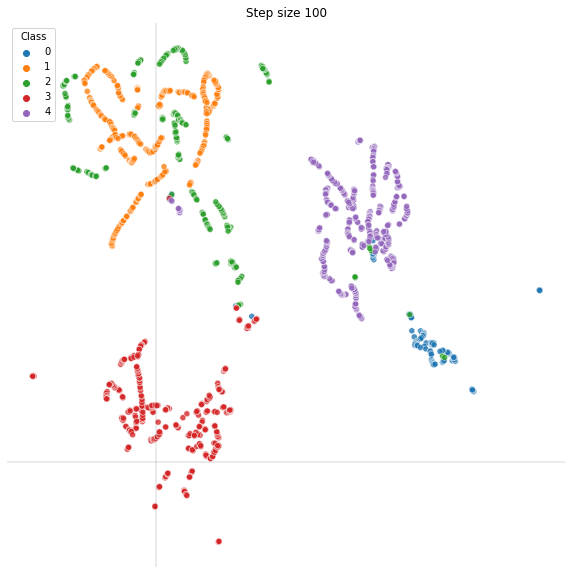

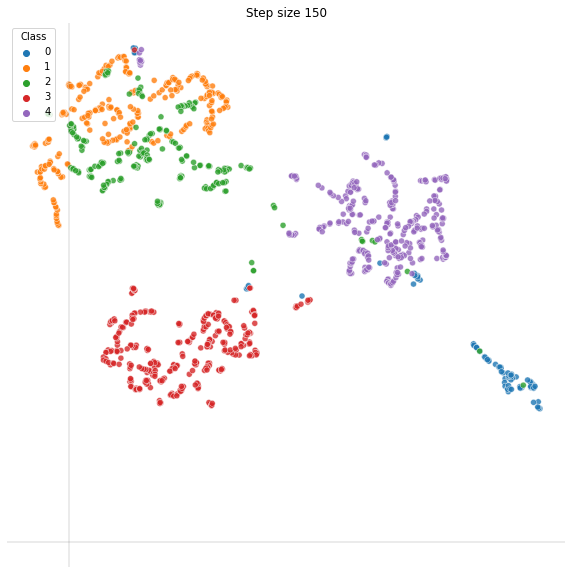

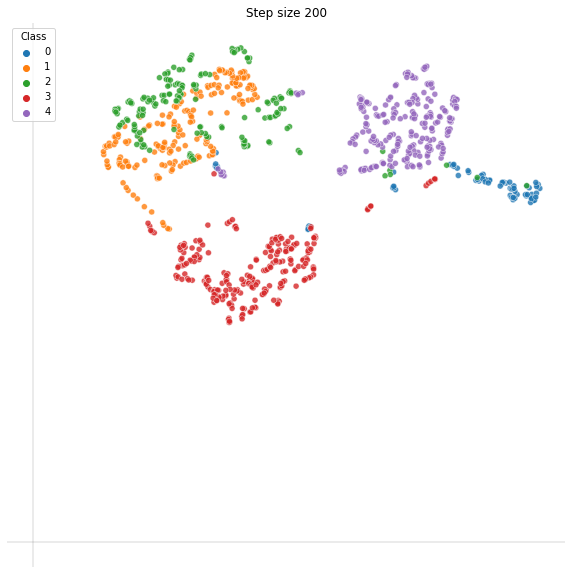

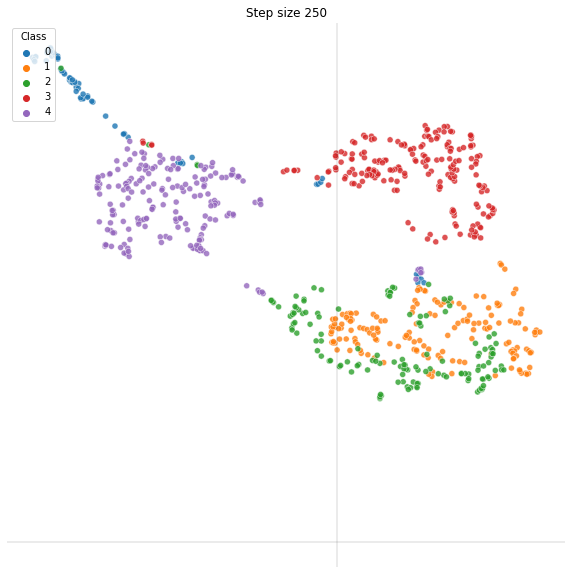

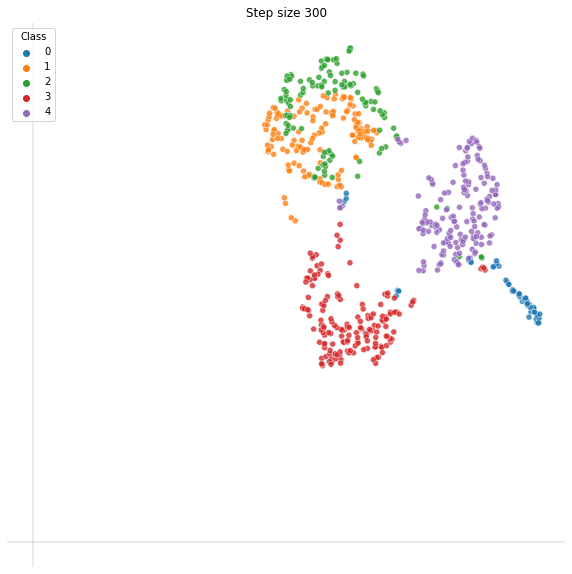

In [479]:
for i in range(100,301,50):
    parameters['step'] = i
    X, y = audio_task.load_data(parameters)
    run_show_UMAP(X,y,5,"Step size "+str(i))

In [480]:
parameters = {
'size':6000, # how long each window is, in samples
'step':300, # how many samples to move forward in each window
'decimate':2, # how much reduction of the feature vector to perform; integer = 1,2,3,4,5...
'feature_range' :(0, 1), # what slice of the feature vectors to take (0.0, 1.0)=whole vector
# must be between 0.0 and 1.0 for the start and end 
'window_fn':"boxcar", # one of window_fns (below)
'feature_fn':"fft" # one of feature_fns    
}
X, y = audio_task.load_data(parameters)

Loading into 280 windows of length 6000
Loading into 683 windows of length 6000
Loading into 584 windows of length 6000
Loading into 834 windows of length 6000
Loading into 808 windows of length 6000
Using fft transform and a boxcar window.


## Classifier
The code below creates a standard KNN classifier which predicts the output class based on the 7 nearest elements in feature vector space. 

In [481]:
# fit a classifier
classifier = audio_task.knn_fit(X, y)



### Visualising predictions 
You can preview your results with a separate (non-secret) test set which is provided. This will show you a visualisation of your classifier versus the ground truth. Each visualisation shows the true activity (below the axis) as coloured blocks and the predicted activity (from the classifier) as coloured blocks above the axis.

In the case of perfect classification, the blocks above and below the line will be exactly the same. In practice, there will always be significant noise.

Testing with data/challenge_test_0
Loading into 243 windows of length 6000
Predicting...
Prediction accuracy 0.664
Confusion matrix
[[491   0   0   0   0]
 [116  73  99  16  24]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 60   0  15   0  89]]

Testing with data/challenge_test_1
Loading into 386 windows of length 6000
Predicting...
Prediction accuracy 0.215
Confusion matrix
[[ 30  36  16 241 135]
 [  0   0   0   0   0]
 [ 24  59  91 127   4]
 [  0  35 269 152   0]
 [ 75   0   0 174  55]]

Testing with data/challenge_test_2
Loading into 164 windows of length 6000
Predicting...
Prediction accuracy 0.875
Confusion matrix
[[ 29   7  79]
 [  0   0   0]
 [  0   0 574]]

Testing with data/challenge_test_3
Loading into 359 windows of length 6000
Predicting...
Prediction accuracy 0.685
Confusion matrix
[[432   0   1  29  12]
 [ 88  70 268  27  20]
 [  0   0   0   0   0]
 [  0   2   0 471   0]
 [  0   0   0   0   0]]

Testing with data/challenge_test_4
Loading into 237 windows of length 6000

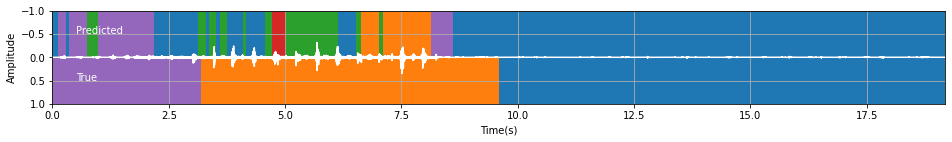

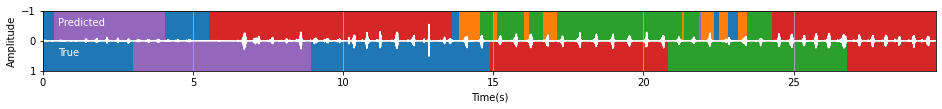

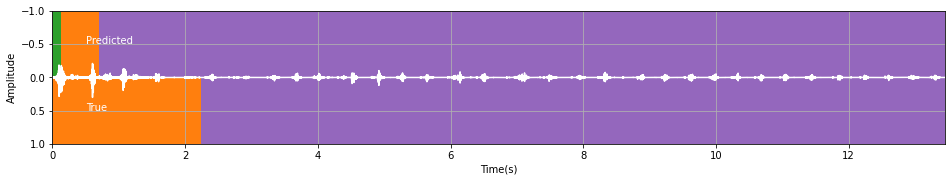

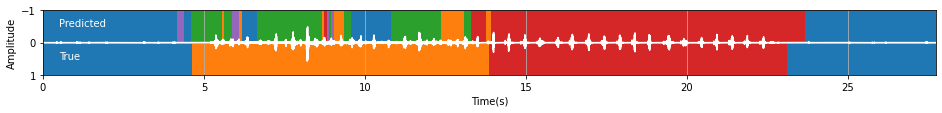

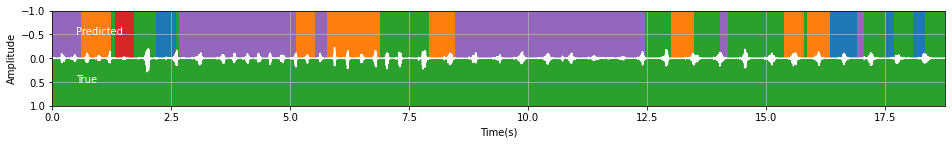

In [482]:
## Example usage -- show results for all of the test cases
for i in range(5):
    audio_task.plot_test(classifier, parameters, f"data/challenge_test_{i}")

### Final test function
There is a test function `challenge_evaluate_performance(classifier_fn)`. This gives you your total current score. You don't have access to the internals of this function. See below for how to use it.
The test takes some time to run; so you must be parsimonious with your calls to it.

In [483]:
## Shows how to evaluate your performance
audio_task.run_secret_test(classifier, parameters)

Loading into 644 windows of length 6000
Predicting...


c:\users\tomas\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\tomas\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\tomas\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(r

Loading into 189 windows of length 6000
Predicting...


c:\users\tomas\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\tomas\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\tomas\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, 

Loading into 105 windows of length 6000
Predicting...
Loading into 573 windows of length 6000
Predicting...


c:\users\tomas\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\tomas\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\tomas\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(r

Loading into 8 windows of length 6000
Predicting...
Loading into 220 windows of length 6000
Predicting...


c:\users\tomas\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\tomas\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\tomas\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, 

Loading into 149 windows of length 6000
Predicting...


c:\users\tomas\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\tomas\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\tomas\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(r

Loading into 483 windows of length 6000
Predicting...
*** Total score: 85.25 ***


c:\users\tomas\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\tomas\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\tomas\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(r

In [478]:
# parameters = {
# 'size':6000, # how long each window is, in samples
# 'step':256, # how many samples to move forward in each window
# 'decimate':2, # how much reduction of the feature vector to perform; integer = 1,2,3,4,5...
# 'feature_range' :(0.0, 1), # what slice of the feature vectors to take (0.0, 1.0)=whole vector
# 'window_fn':"boxcar", # one of window_fns (below)
# 'feature_fn':"fft" # one of feature_fns    
# }
# gives
# *** Total score: 85.83 ***

In [434]:
# parameters = {
# 'size':6000, # how long each window is, in samples
# 'step':128, # how many samples to move forward in each window
# 'decimate':2, # how much reduction of the feature vector to perform; integer = 1,2,3,4,5...
# 'feature_range' :(0, 1), # what slice of the feature vectors to take (0.0, 1.0)=whole vector
# # must be between 0.0 and 1.0 for the start and end 
# 'window_fn':"boxcar", # one of window_fns (below)
# 'feature_fn':"fft" # one of feature_fns    
# }
# gives *** Total score: 86.75 ***